In [1]:
import numpy as np
import pandas as pd
from shutil import copyfile
# from astropy.cosmology import Planck13 as cosmo
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
from astropy.cosmology import z_at_value
import fsps
from matplotlib import gridspec
import matplotlib as mpl
from astropy.io import fits
from astropy import wcs
from astropy.table import Table
import astropy.units as u
from sim_engine import Scale_model
from spec_tools import Source_present, Oldest_galaxy, Sig_int, Smooth, Rescale_sfh, \
    lbt_to_z, boot_to_posterior, age_to_z, Posterior_spec
from spec_stats import Smooth, Highest_density_region, Linear_fit
from spec_id import *
from spec_id_2d import Gen_temp_dict_addline
from spec_stats import Highest_density_region, Linear_fit
from spec_exam import Gen_spec
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, interp2d
from glob import glob
import seaborn as sea
import os
from grizli import multifit
from grizli import model
from grizli.utils import SpectrumTemplate
from sim_engine import forward_model_grism

import pickle
from spec_tools import Gen_SFH

from time import time
sea.set(style='white')
sea.set(style='ticks')
sea.set_style({'xtick.direct'
               'ion': 'in','xtick.top':True,'xtick.minor.visible': True,
               'ytick.direction': "in",'ytick.right': True,'ytick.minor.visible': True})
cmap = sea.cubehelix_palette(12, start=2, rot=.2, dark=0, light=1.0, as_cmap=True)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### set home for files
hpath = os.environ['HOME'] + '/'

if hpath == '/Users/Vince.ec/':
    dpath = '/Volumes/Vince_research/Data/' 
    
else:
    dpath = hpath + 'Data/' 


Couldn't `import tristars`.  Get it from https://github.com/gbrammer/tristars to enable improved blind astrometric matching with triangle asterisms.



In [32]:
# alldb = pd.read_pickle('../dataframes/fitdb/allfits_1D.pkl')
# sfdb = pd.read_pickle('../dataframes/fitdb/SFfits_1D.pkl')

# inout = []
# for i in alldb.index:
#     IO = 'i'
#     if alldb.field[i] == 'GND' and alldb.id[i] in sfdb.query('field == "GND"').id.values:
#         IO = 'o' 
#     if alldb.field[i] == 'GSD' and alldb.id[i] in sfdb.query('field == "GSD"').id.values:
#         IO = 'o' 
#     inout.append(IO)
    
# alldb['inout'] = inout

# Qdb = alldb.query('inout == "i" and t_50 > 0')

# adb = pd.concat([Qdb, sfdb])
# adb = adb.reset_index()
# adb = adb.drop(columns='index')
adb = pd.read_pickle('../dataframes/fitdb/all_galaxies_wlines_1d.pkl')
Adb = adb.query('AGN != "AGN" and lmass > 10 and 0.7 < zgrism < 2.7')

from scipy.optimize import curve_fit

def gauss(x,mu,sigma,A):
    return A*np.exp(-(x-mu)**2/2/sigma**2)

def bimodal(x,mu1,sigma1,A1,mu2,sigma2,A2):
    return gauss(x,mu1,sigma1,A1)+gauss(x,mu2,sigma2,A2)

y,x=np.histogram(Adb.log_ssfr.values,100)

x=(x[1:]+x[:-1])/2 # for len(x)==len(y)

expected=(-12, 0.45, 12,-9.56, 0.649,25)
params,cov=curve_fit(bimodal,x,y,expected)
sigma=np.sqrt(np.diag(cov))
print(params)
X = np.linspace(-14, -7, 10000)
Qdist = gauss(X, -11.50173391, 0.68224873, 7.21979314)
SFdist = gauss(X, -9.46921134, 0.49696219, 20.36197415)

Qint = []
Sint = []
for i in range(len(X)):
    Qint.append(np.trapz(Qdist[i:i+2],X[i:i+2]))
    Sint.append(np.trapz(SFdist[i:i+2],X[i:i+2]))    

Fint = np.add(Qint, Sint)

SFprob = interp1d(X,Sint / Fint)

t_q = []
lSig = []
lRe = []
lZ = []
z50 = []
concen = []
SFR = []
sfprob = []
for i in adb.index:
    if adb.zgrism[i] < 0:
        adb.zgrism[i] = adb.zfit[i]

    if adb.sSFR_avg[i] > 0:
        adb.log_ssfr[i] = adb.sSFR_avg[i]
     
    t_q.append(adb.t_50[i] - adb.t_90[i])
    lSig.append(np.log10(adb.Sigma1[i]))
    lRe.append(np.log10(adb.Re[i]))
    lZ.append(np.log10(adb.Z[i]))
    z50.append(cosmo.lookback_time(adb.z_50[i]).value)
    concen.append(np.log10(adb.Sigma1[i] / (10**adb.lmass[i])))
    SFR.append(np.log10(10**adb.log_ssfr[i] * 10**adb.lmass[i]))
    sfprob.append(float(SFprob(adb.log_ssfr[i])))
    
adb['t_q'] = t_q
adb['log_Sigma1'] = lSig
adb['log_Re'] = lRe
adb['log_Z'] = lZ
adb['z50'] = z50
adb['concen'] = concen
adb['log_sfr'] = SFR
adb['sf_prob'] = sfprob
  
Adb = adb.query('AGN != "AGN" and lmass > 10 and concen < -0.4 and 0.7 < zgrism < 2.7')
Axdb = adb.query('AGN == "AGN" and lmass > 10 and concen < -0.4 and 0.7 < zgrism < 2.7')

qdb = Adb.query('log_ssfr < -11 and AGN != "AGN" and n_f < 3 and  -2.4 < concen < -0.5')
sfdb = Adb.query('log_ssfr > -11 and AGN != "AGN" and n_f < 3 and  -2.4 < concen < -0.5')
xqdb = adb.query('log_ssfr < -11 and AGN == "AGN" and n_f < 3 and  -2.4 < concen < -0.5')
xsdb = adb.query('log_ssfr > -11 and AGN == "AGN" and n_f < 3 and -2.4 < concen < -0.5')

[-11.50173391   0.68224873   7.21979314  -9.46921134   0.49696219
  20.36197415]


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in true_divide
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [176]:
alldb = pd.read_pickle('../dataframes/fitdb/allfits_1D.pkl')
sfdb = pd.read_pickle('../dataframes/fitdb/SFfits_1D.pkl')

inout = []
for i in alldb.index:
    IO = 'i'
    if alldb.field[i] == 'GND' and alldb.id[i] in sfdb.query('field == "GND"').id.values:
        IO = 'o' 
    if alldb.field[i] == 'GSD' and alldb.id[i] in sfdb.query('field == "GSD"').id.values:
        IO = 'o' 
    inout.append(IO)
    
alldb['inout'] = inout

Qdb = alldb.query('inout == "i" and t_50 > 0')

adb = pd.concat([Qdb, sfdb])
adb = adb.reset_index()
adb = adb.drop(columns='index')

adb['bfm7'] = np.repeat(np.nan, len(adb))
adb['bfm8'] = np.repeat(np.nan, len(adb))
adb['bfm9'] = np.repeat(np.nan, len(adb))
adb['bfm10'] = np.repeat(np.nan, len(adb))
adb['bfz'] = np.repeat(np.nan, len(adb))

for i in adb.index:
    if not adb.bfa[i]**2 > 0:
        try:
            m, a, m1, m2, m3, m4, m5, m6, m7, m8, m9, m10, lm, z, d, bp1, rp1, ba, bb, bl, \
            ra, rb, rl, lwa, logz= np.load('../data/bestfits/{}_{}_tabfit_bfit.npy'.format(adb.field[i], adb.id[i]))

            adb.bfm[i] = m
            adb.bfa[i] = a
            adb.bfm1[i] = m1
            adb.bfm2[i] = m2
            adb.bfm3[i] = m3
            adb.bfm4[i] = m4
            adb.bfm5[i] = m5
            adb.bfm6[i] = m6
            adb.bfm7[i] = m7
            adb.bfm8[i] = m8
            adb.bfm9[i] = m9
            adb.bfm10[i] = m10
            adb.bflm[i] = lm
            adb.bfz[i] = z
            adb.bfd[i] = d
            adb.bfbp1[i] = bp1 
            adb.bfrp1[i] = rp1
            adb.bfba[i] = ba
            adb.bfbb[i] = bb
            adb.bfbl[i] = bl
            adb.bfra[i] = ra
            adb.bfrb[i] = rb
            adb.bfrl[i] = rl
        except:
            pass
adb.to_pickle('../dataframes/fitdb/all_galaxies_1d.pkl')


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

#### Data plots

## Field plots

In [4]:
N_f160 = fits.open('/Volumes/Vince_CLEAR/gnd_img/goodsn_3dhst.v4.0.F160W_orig_sci.fits')
S_f160 = fits.open('/Volumes/Vince_CLEAR/gsd_img/goodss_3dhst.v4.0.F160W_orig_sci.fits')

nflts = glob(hpath + 'Clear_data/n_flt_files/*')
sflts = glob(hpath + 'Clear_data/s_flt_files/*')

Ndat = fits.open(nflts[0])
Sdat = fits.open(sflts[0])

def flt_pos(fn):
    flt=fits.open(fn)
    w = wcs.WCS(flt[1].header)

    xpixlim=len(flt[1].data[0])
    ypixlim=len(flt[1].data)

    pos=w.wcs_pix2world([[0,0],[xpixlim, 0],[xpixlim, ypixlim],[0, ypixlim]],1)
            
    return pos

In [28]:
Npos = []
Nfnames = []

Spos = []
Sfnames = []

for i in range(len(nflts)):
    Ndat = fits.open(nflts[i])

    if Ndat[0].header['TARGNAME'][1] == 'N':
        Nfnames.append(Ndat[0].header['TARGNAME'])
        p1,p2,p3,p4 = flt_pos(nflts[i])
        Npos.append(np.array([p1,p2,p3,p4,p1]).T)

for i in range(len(sflts)):
    Sdat = fits.open(sflts[i])

    Sfnames.append(Sdat[0].header['TARGNAME'])
    p1,p2,p3,p4 = flt_pos(sflts[i])
    Spos.append(np.array([p1,p2,p3,p4,p1]).T)
        
Nw = wcs.WCS(N_f160[0].header)
Sw = wcs.WCS(S_f160[0].header)

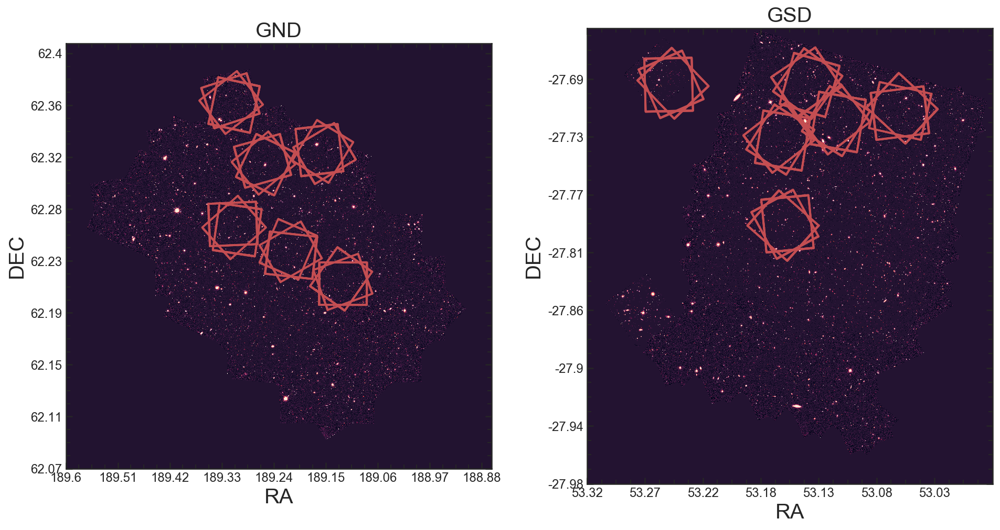

In [57]:
gs = gridspec.GridSpec(1,2)
plt.figure(figsize=[16,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

field = ['GN1','GN2','GN3','GN4','GN5','GN7']

for i in range(len(Npos)):
    pos = Nw.wcs_world2pix(np.array([Npos[i][0],Npos[i][1]]).T,1).T
    for ii in range(len(field)):
        if field[ii] == Nfnames[i]:
            idx = ii
            break
    
    ax1.plot(pos[0],pos[1], 'r',zorder=1)
ax1.imshow(N_f160[0].data, vmin = -0.01, vmax = 0.1)

ax1.set_xlim(0,N_f160[0].data[0].size)
ax1.set_ylim(0,N_f160[0].data.T[0].size)
ax2.set_xlim(0,S_f160[0].data[0].size)
ax2.set_ylim(0,S_f160[0].data.T[0].size)

ax1.set_xticks(ax1xticks)
ax1.set_xticklabels(np.round(x1vals,2))
ax1.set_yticks(ax1yticks)
ax1.set_yticklabels(np.round(y1vals,2))
ax2.set_xticks(ax2xticks)
ax2.set_xticklabels(np.round(x2vals,2))
ax2.set_yticks(ax2yticks)
ax2.set_yticklabels(np.round(y2vals,2))

ax1.tick_params(axis='both', which='major', labelsize=12)
ax2.tick_params(axis='both', which='major', labelsize=12)

ax1.set_xlabel('RA',size=20)
ax1.set_ylabel('DEC',size=20)
ax2.set_xlabel('RA',size=20)
ax2.set_ylabel('DEC',size=20)

ax1.set_title('GND', fontsize = 20)
ax2.set_title('GSD', fontsize = 20)

field = ['GS1','GS2','GS3','GS4','GS5','ERSPRIME']

for i in range(len(Spos)):
    pos = Sw.wcs_world2pix(np.array([Spos[i][0],Spos[i][1]]).T,1).T
    for ii in range(len(field)):
        if field[ii] == Sfnames[i]:
            idx = ii
            break
    
    ax2.plot(pos[0],pos[1], 'r',zorder=1)

ax2.imshow(S_f160[0].data, vmin = -0.01, vmax = 0.1)
plt.savefig('../plots/evolution_plots/Field_plot.pdf', bbox_inches = 'tight')    
 

## spec plots

In [190]:
from shutil import copy

for i in adb.index:
    isfile = False
    
    if len(glob('/Volumes/Vince_CLEAR/SF_BEAMS/*{}*_*{}*.beams.fits'.format(adb.field[i][1], adb.id[i]))) > 0:
        isfile = True

    if len(glob('/Volumes/Vince_CLEAR/SF_BEAMS_2/*{}*_*{}*.beams.fits'.format(adb.field[i][1], adb.id[i]))) > 0:
        isfile = True
    
    if len(glob('/Volumes/Vince_CLEAR/Q_BEAMS/*{}*_*{}*.beams.fits'.format(adb.field[i][1], adb.id[i]))) > 0:
        isfile = True
        
        
    if not isfile:
        flist = glob('/Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/*{0}*/*{0}*_*{1}*.beams.fits'.format(adb.field[i][1], adb.id[i]))
        
        for f in flist:
            copy(f,'/Volumes/Vince_CLEAR/Q_BEAMS/' + os.path.basename(f) )
#             print('/Volumes/Vince_CLEAR/Q_BEAMS/' + os.path.basename(f))

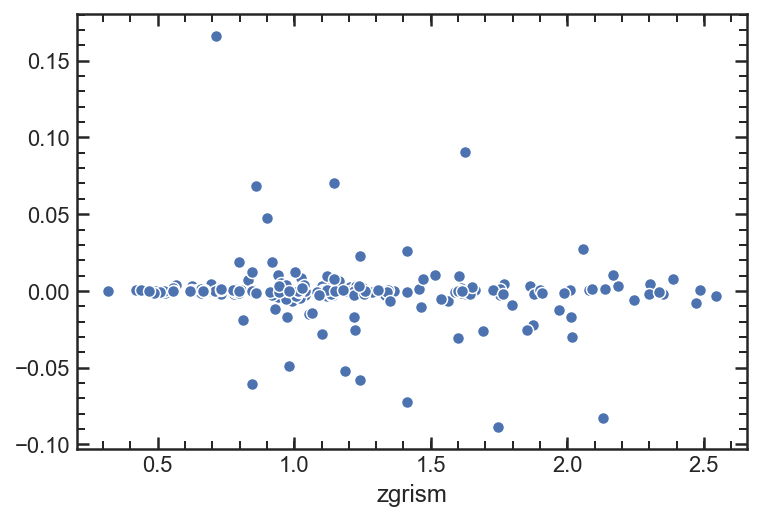

In [192]:
sea.scatterplot(adb.zgrism, adb.bfz - adb.zgrism)

In [149]:
from spec_id import Calibrate_grism, Scale_model
def Best_fit_scale(wv, fl, er, mfl, p1):
    cal = Calibrate_grism([wv, fl, er], mfl, p1)
    scale = Scale_model(fl / cal, er/ cal, mfl)
    FL =  fl/ cal/ scale
    ER =  er/ cal/ scale
    return FL, ER

def Q_spec_adjust(Gs, bestfits):
    sp = fsps.StellarPopulation(zcontinuous = 1, logzsol = 0, sfh = 3, dust_type = 1)
    wvs, flxs, errs, beams, trans = Gather_grism_data_from_2d(Gs, sp)

    m, a, m1, m2, m3, m4, m5, m6, m7, m8, m9, m10, lm, z, d,\
        bp1, rp1, ba, bb, bl, ra, rb, rl, lwa, logz= BFS

    sp.params['dust2'] = d
    sp.params['dust1'] = d
    sp.params['logzsol'] = np.log10(m)
    
    time, sfr, tmax = convert_sfh(get_agebins(a), [m1, m2, m3, m4, m5, m6, m7, m8, m9, m10], maxage = a*1E9)

    sp.set_tabular_sfh(time,sfr) 

    wave, flux = sp.get_spectrum(tage = a, peraa = True)

    Gmfl, Pmfl = Full_forward_model(Gs, wave, F_lam_per_M(flux,wave*(1 + z), z, 0, sp.stellar_mass)*10**lm, z, 
                                    wvs, flxs, errs, beams, trans)
    
    BFL, BER = Best_fit_scale(wvs[0], flxs[0], errs[0], Gmfl[0], bp1)
    RFL, RER = Best_fit_scale(wvs[1], flxs[1], errs[1], Gmfl[1], rp1)
    
    return BFL, BER, RFL, RER, Gmfl, wave, F_lam_per_M(flux,wave*(1 + z), z, 0, sp.stellar_mass)*10**lm

def SF_spec_adjust(Gs, bestfits, z):
    sp = fsps.StellarPopulation(zcontinuous = 1, logzsol = 0, sfh = 3, dust_type = 2)
    sp.params['dust1'] = 0
    
    wvs, flxs, errs, beams, trans = Gather_grism_data_from_2d(Gs, sp)

    m, a, m1, m2, m3, m4, m5, m6, lm, d, bp1, rp1, ba, bb, bl, ra, rb, rl= BFS

    sp.params['dust2'] = d
    sp.params['logzsol'] = np.log10(m)

    time, sfr, tmax = convert_sfh(get_agebins(a, binnum = 6), [m1, m2, m3, m4, m5, m6], maxage = a*1E9)

    sp.set_tabular_sfh(time,sfr) 

    wave, flux = sp.get_spectrum(tage = a, peraa = True)

    Gmfl, Pmfl = Full_forward_model(Gs, wave, F_lam_per_M(flux,wave*(1 + z), z, 0, sp.stellar_mass)*10**lm, z, 
                                    wvs, flxs, errs, beams, trans)
    
    BFL, BER = Best_fit_scale(wvs[0], flxs[0], errs[0], Gmfl[0], bp1)
    RFL, RER = Best_fit_scale(wvs[1], flxs[1], errs[1], Gmfl[1], rp1)
    
    return BFL, BER, RFL, RER, Gmfl, wave, F_lam_per_M(flux,wave*(1 + z), z, 0, sp.stellar_mass)*10**lm

In [145]:
for i in Adb.query('0.2 < sf_prob < 0.8 and zgrism < 2 and field == "GSD"').sort_values('id').index:
    if os.path.isfile('../plots/newspec_exam/{}-{}_beams.png'.format(Adb.field[i], Adb.id[i])):
        print('../plots/newspec_exam_2/{}-{}_beams.png'.format(Adb.field[i], Adb.id[i]))

../plots/newspec_exam_2/GSD-20404_beams.png
../plots/newspec_exam_2/GSD-29018_beams.png
../plots/newspec_exam_2/GSD-36095_beams.png
../plots/newspec_exam_2/GSD-39433_beams.png
../plots/newspec_exam_2/GSD-39654_beams.png
../plots/newspec_exam_2/GSD-39690_beams.png
../plots/newspec_exam_2/GSD-39948_beams.png
../plots/newspec_exam_2/GSD-40142_beams.png
../plots/newspec_exam_2/GSD-40541_beams.png
../plots/newspec_exam_2/GSD-43959_beams.png
../plots/newspec_exam_2/GSD-45994_beams.png
../plots/newspec_exam_2/GSD-46070_beams.png
../plots/newspec_exam_2/GSD-49401_beams.png
../plots/newspec_exam_2/GSD-49493_beams.png
../plots/newspec_exam_2/GSD-49692_beams.png


load_master_fits: /Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/GN1/GN1_36795.beams.fits
1 icat20tdq_flt.fits G102


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-1.0.dev1443-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3596: RuntimeWarning: divide by zero encountered in true_divide
  self.ivar = 1/self.grism.data['ERR']**2


2 icat20tiq_flt.fits G102
3 icat20tpq_flt.fits G102
4 icat20tuq_flt.fits G102
5 icxt46swq_flt.fits G102
6 icxt46sxq_flt.fits G102
7 icxt46t0q_flt.fits G102
8 icxt46t2q_flt.fits G102
9 ib3720f0q_flt.fits G141
10 ib3720f4q_flt.fits G141
11 ib3720fgq_flt.fits G141
12 ib3720fkq_flt.fits G141


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-1.0.dev1443-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:1585: RuntimeWarning: divide by zero encountered in true_divide
  ivar = 1./(1/b.ivar + (self.sys_err*sciu)**2)
/Users/Vince.ec/GitHub/Cluster_and_field/scripts/spec_exam.py:785: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if bm.grism.parent_file in BMX:
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-1.0.dev1443-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:590: RuntimeWarning: invalid value encountered in true_divide
  self.optimal_profile = m/m.sum(axis=0)


False
advanced
False
advanced


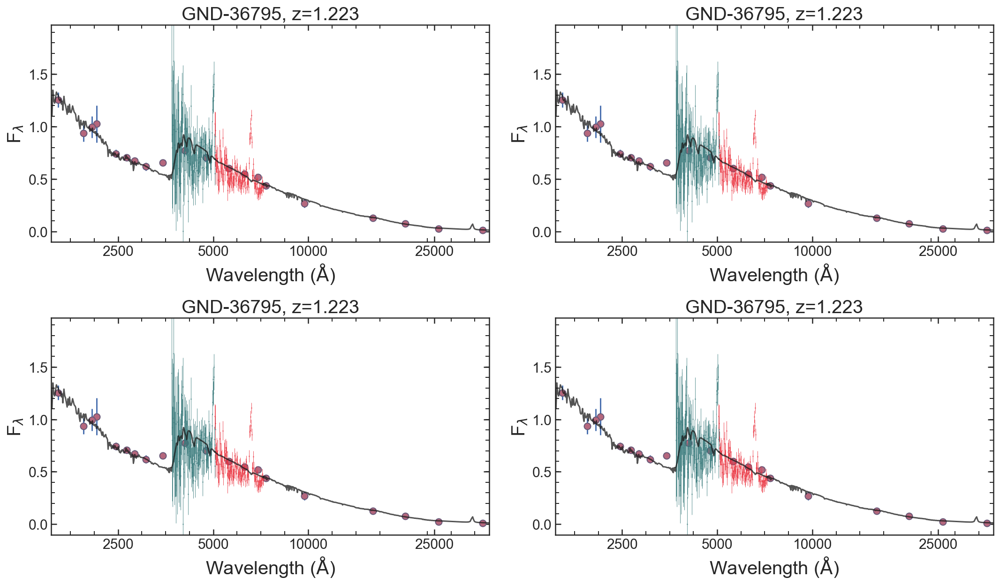

In [154]:
from spec_id import convert_sfh, Full_forward_model, Full_calibrate_2, get_agebins, F_lam_per_M


gs = gridspec.GridSpec(2,2, hspace = 0.35, wspace=0.15)

plt.figure(figsize=[18,10])

LDX = 0 
TDX = 0

gid = [36795,45994,21156,39170]
field = ['GND','GSD','GND','GSD']
usedb = [True, True, False,False]
sf = ['SF', 'SF', 'Q', 'Q']
for i in range(4):   
    x=i
    Gs = Gen_spec_2D(field[x], gid[x],Adb.query('id == {}'.format(gid[x])).zgrism.values[0], g102_lims=[8200, 11300], g141_lims=[11200, 16000],
                     phot_errterm = 0.04, irac_err = 0.08,)

    if usedb[x]:
        params = ['m', 'a', 'm1', 'm2', 'm3', 'm4', 'm5', 'm6', 'lm', 'd', 'bp1', 
                  'rp1', 'ba', 'bb', 'bl', 'ra', 'rb', 'rl']
        BFS = []

        for i in params:
            BFS.append(sfdb.query('field == "{}" and id == {}'.format(field[x], gid[x]))['bf{}'.format(i)].values[0])
    else:
        BFS = np.load('../data/bestfits/{}_{}_tabfit_bfit.npy'.format(field[x], gid[x]))


    if sf[x] == 'SF':
        BFL, BER, RFL, RER, Gmfl, wave, flam = SF_spec_adjust(Gs, BFS, Gs.specz)
    else:
        BFL, BER, RFL, RER, Gmfl, wave, flam = Q_spec_adjust(Gs, BFS)

    ax = plt.subplot(gs[TDX,LDX])

    ax.errorbar(np.log10(Gs.Bwv_rf),BFL*1E18, BER*1E18,
            linestyle='None', marker='o', markersize=0.25, color='#36787A', zorder = 2, elinewidth = 0.4)
    ax.plot(np.log10(Gs.Bwv_rf),Gmfl[0] *1E18,'k', zorder = 4, alpha = 0.75)
    IDB = [U for U in range(len(wave)) if wave[U] < Gs.Bwv_rf[0]]

    ax.errorbar(np.log10(Gs.Rwv_rf),RFL*1E18, RER*1E18,
            linestyle='None', marker='o', markersize=0.25, color='#EA2E3B', zorder = 2, elinewidth = 0.4)
    ax.plot(np.log10(Gs.Rwv_rf),Gmfl[1] *1E18,'k', zorder = 4, alpha = 0.75)
    IDR = [U for U in range(len(wave)) if wave[U] > Gs.Rwv_rf[-1]]


    ax.errorbar(np.log10(Gs.Pwv_rf),Gs.Pflx*1E18,Gs.Perr*1E18,
            linestyle='None', marker='o', markersize=7, markerfacecolor='#B5677D', zorder = 1,
                 markeredgecolor = '#685877',markeredgewidth = 1)

    ax.plot(np.log10(wave)[IDB],flam[IDB]*1E18,'k', alpha = 0.75, zorder=5)
    ax.plot(np.log10(wave)[IDR],flam[IDR]*1E18,'k', alpha = 0.75)
    ax.set_xlim(np.log10(min(Gs.Pwv_rf)*0.95),np.log10(max(Gs.Pwv_rf)*1.05))
    
    fmax = max(Gs.Rfl *1E18)
    
    if fmax < max(Gs.Bfl *1E18):
        fmax = max(Gs.Bfl *1E18)
        
    if fmax < max(Gs.Pflx *1E18):
        fmax = max(Gs.Pflx *1E18)
    
    
    ax.set_ylim(-0.1,fmax*1.1)
    ax.set_xticks(np.log10([2500,5000,10000,25000]))
    ax.set_xticklabels(np.array([2500,5000,10000,25000]))
    ax.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize=20)
    ax.set_ylabel(r'F$_\lambda$', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=15)
    
    ax.set_title('{}-{}, z={}'.format(field[x], gid[x], np.round(Gs.specz,3)), fontsize = 20)

    if LDX == 0:
        LDX += 1
    else:
        LDX = 0
        TDX +=1







In [110]:
 len(np.load('../data/bestfits/{}_{}_tabfit_bfit.npy'.format(field[x], gid[x])))

25

In [99]:
# Adb.query('id == {}'.format(gid[x])).zgrism
Adb.query('id == 39120')

,AGN,Av,Av_hdr,Av_modality,Ra,Ra_f125,Ra_f125_sig,Ra_f160,Ra_f160_sig,Ra_nsig,...,zgrism_hdr,zgrism_modality,t_q,log_Sigma1,log_Re,log_Z,z50,concen,log_sfr,sf_prob


In [56]:
ax1xticks = np.arange(0,N_f160[0].data[0].size, 2500)
ax1yticks = np.arange(0,N_f160[0].data.T[0].size, 2500)
ax2xticks = np.arange(0,S_f160[0].data[0].size, 2500)
ax2yticks = np.arange(0,S_f160[0].data.T[0].size, 2500)

x1vals = []
y1vals = []
x2vals = []
y2vals = []

for i in range(len(ax1xticks)):
    x1vals.append(Nw.wcs_pix2world([[ax1xticks[i],0]],1)[0][0])
for i in range(len(ax1yticks)):
    y1vals.append(Nw.wcs_pix2world([[0,ax1yticks[i]]],1)[0][1])
for i in range(len(ax2xticks)):
    x2vals.append(Sw.wcs_pix2world([[ax2xticks[i],0]],1)[0][0])
for i in range(len(ax2yticks)):
    y2vals.append(Sw.wcs_pix2world([[0,ax2yticks[i]]],1)[0][1])

In [55]:
y1vals

[189.5965317666924,
 189.59703787502835,
 189.5975453776967,
 189.59805428046738,
 189.59856458914228,
 189.59907630955533,
 189.59958944757275,
 189.6001040090934,
 189.60062000004882]

In [52]:
# plt.imshow(N_f160[0].data[10000:10100,10000:10100], vmin = -0.01, vmax = 0.1)
S_f160[0].data.shape

(19700, 17500)

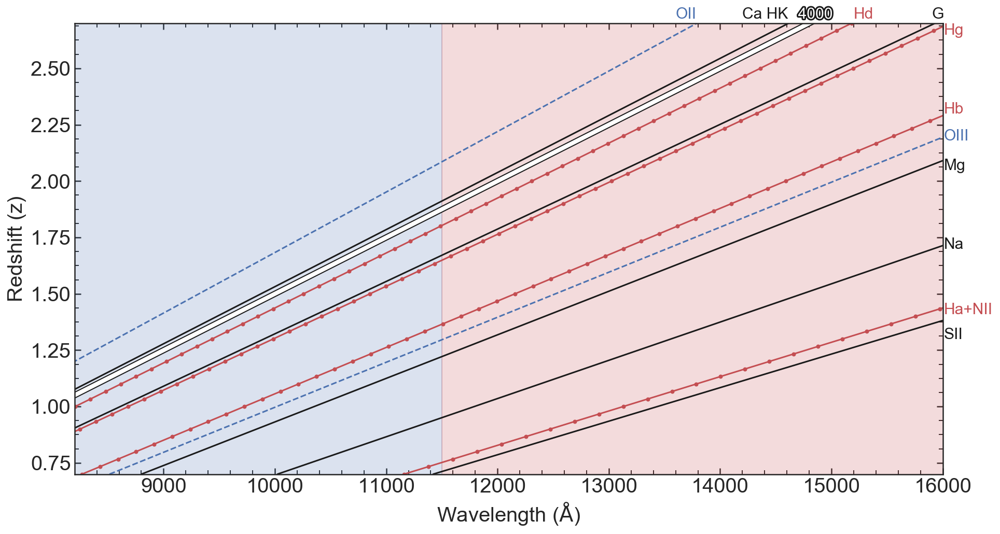

In [155]:
import matplotlib.patheffects as PathEffects

lines = [3950, 4305.61, 5176.7, 5895.6, 6718.29]
lnames = ['Ca HK','G','Mg','Na','SII']

Olines =[3727.092,5008.240]
Onames = ['OII','OIII']
Blines =[4102.89,4341.68,4862.68,6564.61]
Bnames = ['Hd','Hg','Hb','Ha+NII']

rshift = np.linspace(0.7,4,100)

plt.figure(figsize=[15,8])
plt.fill_betweenx(rshift,8000,11500,color = 'b', alpha = 0.2)
plt.fill_betweenx(rshift,11500,16500,color = 'r', alpha = 0.2)
   
for i in range(len(lines)):
    plt.plot(lines[i] * (1+rshift),rshift,'k')   
for i in range(len(Blines)):
    plt.plot(Blines[i] * (1+rshift),rshift,'r.-')
for i in range(len(Olines)):
    plt.plot(Olines[i] * (1+rshift),rshift,'b--')
    
plt.plot(4000 * (1+rshift),rshift,'k', linewidth = 6)   
plt.plot(4000 * (1+rshift),rshift,'w', linewidth = 4)   

    
plt.xlim(8200,16000)
plt.ylim(0.7,2.7)

plt.ylabel('Redshift (z)',size=20)
plt.xlabel('Wavelength ($\\rm \AA$)',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.text(13600,2.72,'OII', fontsize=15,color = 'b')
plt.text(14200,2.72,'Ca HK', fontsize=15,color = 'k')
txt = plt.text(14700,2.72,'4000', size=15, color='w')
plt.text(15200,2.72,'Hd', fontsize=15,color = 'r')
plt.text(15900,2.72,'G', fontsize=15,color = 'k')
plt.text(16010,2.65,'Hg', fontsize=15,color = 'r')
plt.text(16010,2.3,'Hb', fontsize=15,color = 'r')
plt.text(16010,2.18,'OIII', fontsize=15,color = 'b')
plt.text(16010,2.05,'Mg', fontsize=15,color = 'k')
plt.text(16010,1.7,'Na', fontsize=15,color = 'k')
plt.text(16010,1.41,'Ha+NII', fontsize=15,color = 'r')
plt.text(16010,1.3,'SII', fontsize=15,color = 'k')

txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='k')])
plt.savefig('../plots/evolution_plots/line_dist.pdf', bbox_inches = 'tight')    


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


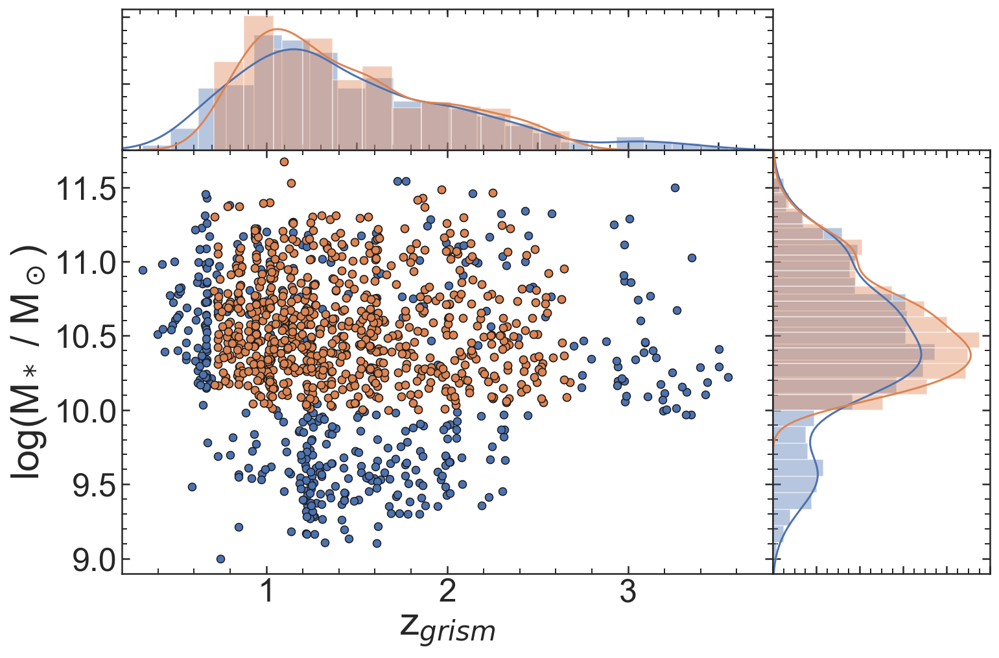

In [387]:
plt.figure(figsize=[12,8])
gs=gridspec.GridSpec(2,2, width_ratios=[3,1], height_ratios=[1,3], wspace=0, hspace=0)
ax1 = plt.subplot(gs[1,0])
ax2 = plt.subplot(gs[0,0])
ax3 = plt.subplot(gs[1,1])

sea.scatterplot(adb.zgrism, adb.lmass, legend = False, palette='viridis_r', edgecolor = 'k', ax = ax1)
sea.distplot(adb.zgrism, ax = ax2)
sea.distplot(adb.lmass, ax = ax3, vertical=True)

sea.scatterplot(Adb.zgrism, Adb.lmass, legend = False, palette='viridis_r', edgecolor = 'k', ax = ax1)
sea.distplot(Adb.zgrism, ax = ax2)
sea.distplot(Adb.lmass, ax = ax3, vertical=True)

ax2.set_xticklabels([])
ax2.set_yticklabels([])
ax3.set_xticklabels([])
ax3.set_yticklabels([])
ax1.set_xlim(0.2,3.8)
ax2.set_xlim(0.2,3.8)
ax1.set_ylim(8.9,11.75)
ax3.set_ylim(8.9,11.75)

ax2.set_xlabel('')
ax3.set_ylabel('')

ax1.set_ylabel('log(M$_*$ / M$_\odot$)', fontsize=30)
ax1.set_xlabel('z$_{grism}$', fontsize=30)
ax1.tick_params(axis='both', which='major', labelsize=25)
plt.savefig('../plots/research_update/full_sample_2.png', bbox_inches = 'tight')    


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


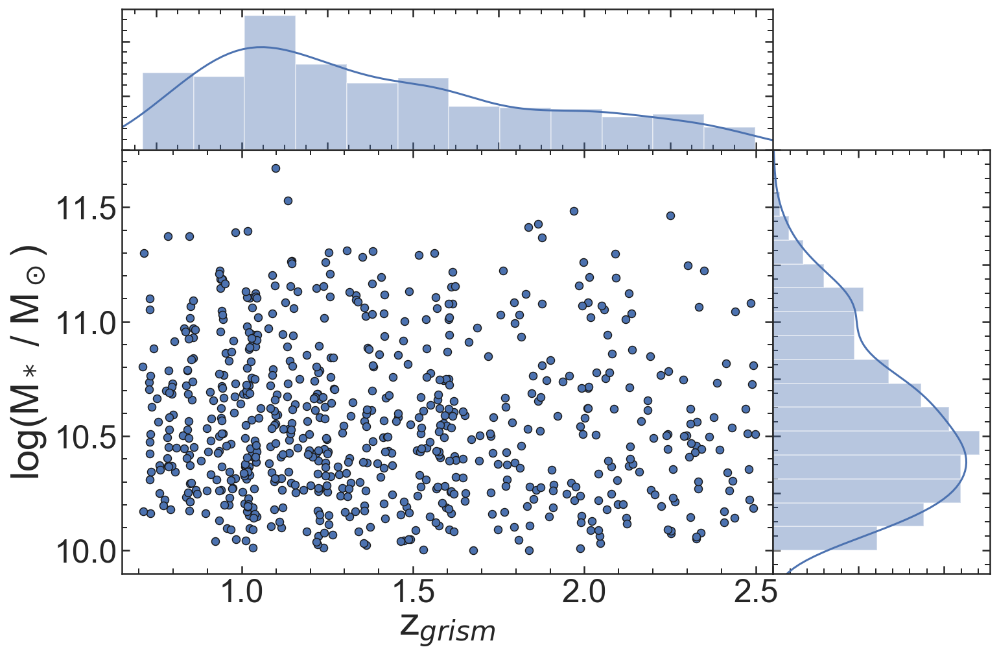

In [283]:
plt.figure(figsize=[12,8])
gs=gridspec.GridSpec(2,2, width_ratios=[3,1], height_ratios=[1,3], wspace=0, hspace=0)
ax1 = plt.subplot(gs[1,0])
ax2 = plt.subplot(gs[0,0])
ax3 = plt.subplot(gs[1,1])

sea.scatterplot(Adb.zgrism, Adb.lmass, legend = False, palette='viridis_r', edgecolor = 'k', ax = ax1)
sea.distplot(Adb.zgrism, ax = ax2)
sea.distplot(Adb.lmass, ax = ax3, vertical=True)
ax2.set_xticklabels([])
ax2.set_yticklabels([])
ax3.set_xticklabels([])
ax3.set_yticklabels([])
ax1.set_xlim(0.65,2.55)
ax2.set_xlim(0.65,2.55)
ax1.set_ylim(9.9,11.75)
ax3.set_ylim(9.9,11.75)

ax2.set_xlabel('')
ax3.set_ylabel('')

ax1.set_ylabel('log(M$_*$ / M$_\odot$)', fontsize=30)
ax1.set_xlabel('z$_{grism}$', fontsize=30)
ax1.tick_params(axis='both', which='major', labelsize=25)

In [342]:
len(Adb)

731

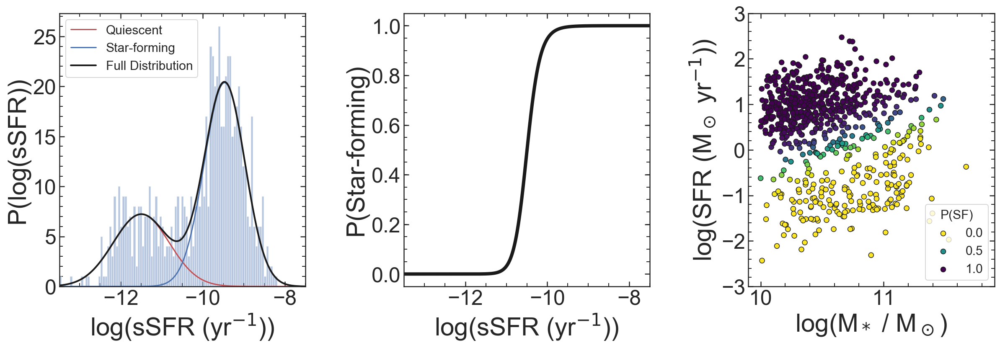

In [362]:
gs = gridspec.GridSpec(1,3,wspace=0.4)
plt.figure(figsize=[20,6])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

sea.distplot(Adb.log_ssfr,bins = 100, kde = False, ax = ax1)

ax1.plot(X, Qdist, 'r', label = 'Quiescent')
ax1.plot(X, SFdist, 'b', label = 'Star-forming')
ax1.plot(X, Qdist + SFdist, 'k', linewidth = 2, label = 'Full Distribution')
ax1.set_ylabel('P(log(sSFR))', fontsize=30)
ax1.set_xlabel('log(sSFR (yr$^{-1}$))', fontsize=30)
ax1.tick_params(axis='both', which='major', labelsize=25)
ax1.set_xlim(-13.5,-7.5)
ax1.legend(loc=2, fontsize=15)

ax2.plot(X, SFprob(X), 'k', linewidth = 4)
ax2.set_ylabel('P(Star-forming)', fontsize=30)
ax2.set_xlabel('log(sSFR (yr$^{-1}$))', fontsize=30)
ax2.tick_params(axis='both', which='major', labelsize=25)
ax2.set_xlim(-13.5,-7.5)


sea.scatterplot(Adb.lmass, Adb.log_sfr, hue = Adb.sf_prob.values, ax = ax3, legend = False, palette='viridis_r', edgecolor = 'k')
ax3.set_ylabel('log(SFR (M$_\odot$ yr$^{-1}$))', fontsize=30)
ax3.set_xlabel('log(M$_*$ / M$_\odot$)', fontsize=30)
ax3.tick_params(axis='both', which='major', labelsize=25)
ax3.set_xlim(9.9,11.9)
ax3.set_ylim(-3,3)
sea.scatterplot([-100],[-100], hue = [0], hue_norm = (0,1), ax = ax3, legend = False, label = '0.0', palette='viridis_r', edgecolor = 'k')
sea.scatterplot([-100],[-100], hue = [0.5], hue_norm = (0,1), ax = ax3, legend = False, label = '0.5', palette='viridis_r', edgecolor = 'k')
sea.scatterplot([-100],[-100], hue = [1], hue_norm = (0,1), ax = ax3, legend = False, label = '1.0', palette='viridis_r', edgecolor = 'k')



ax3.legend(loc=4, fontsize=15, title = 'P(SF)')
ax3.get_legend().get_title().set_fontsize('15')
plt.savefig('../plots/research_update/Psf_1.png', bbox_inches = 'tight')    


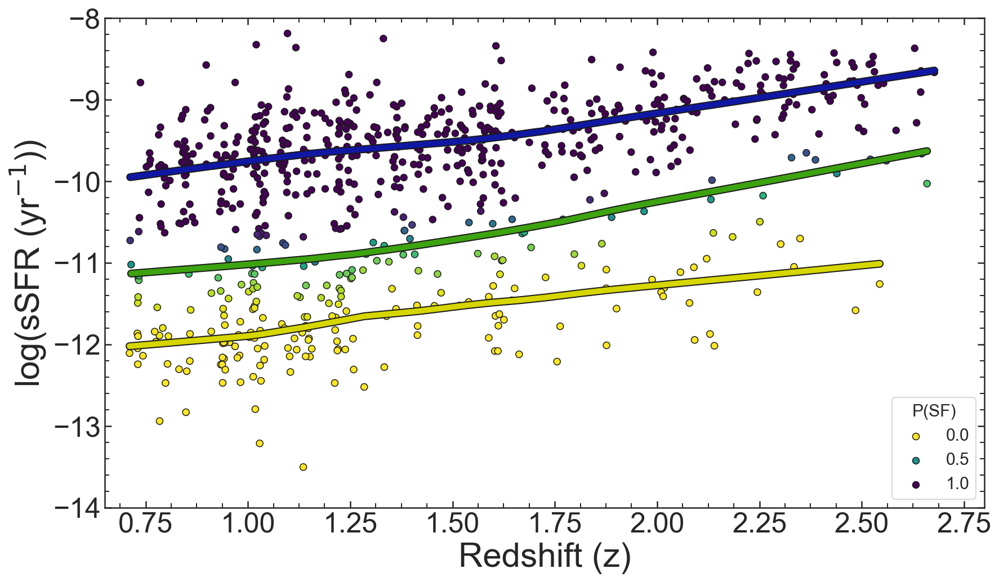

In [428]:
plt.figure(figsize=[14,8])
ax = plt.subplot()
sea.scatterplot(Adb.zgrism, Adb.log_ssfr, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.regplot(Adb.query('sf_prob_2 > 0.8').zgrism, Adb.query('sf_prob_2 > 0.8').log_ssfr, lowess=True, scatter = False, 
            line_kws = {'linewidth':7, 'color':'k'})
sea.regplot(Adb.query('0.2 < sf_prob_2 < 0.8').zgrism, Adb.query('0.2 < sf_prob_2 < 0.8').log_ssfr, lowess=True, scatter = False,            
            line_kws = {'linewidth':7, 'color':'k'})
sea.regplot(Adb.query('sf_prob_2 < 0.2').zgrism, Adb.query('sf_prob_2 < 0.2').log_ssfr, lowess=True, scatter = False,            
            line_kws = {'linewidth':7, 'color':'k'})

sea.regplot(Adb.query('sf_prob_2 > 0.8').zgrism, Adb.query('sf_prob_2 > 0.8').log_ssfr, lowess=True, scatter = False, 
            line_kws = {'linewidth':5, 'color':'#1018A3'})
sea.regplot(Adb.query('0.2 < sf_prob_2 < 0.8').zgrism, Adb.query('0.2 < sf_prob_2 < 0.8').log_ssfr, lowess=True, scatter = False,            
            line_kws = {'linewidth':5, 'color':'#3DA310'})
sea.regplot(Adb.query('sf_prob_2 < 0.2').zgrism, Adb.query('sf_prob_2 < 0.2').log_ssfr, lowess=True, scatter = False,            
            line_kws = {'linewidth':5, 'color':'#D6D600'})

sea.scatterplot([-100],[-100], hue = [0], hue_norm = (0,1), ax = ax, legend = False, label = '0.0', palette='viridis_r', edgecolor = 'k')
sea.scatterplot([-100],[-100], hue = [0.5], hue_norm = (0,1), ax = ax, legend = False, label = '0.5', palette='viridis_r', edgecolor = 'k')
sea.scatterplot([-100],[-100], hue = [1], hue_norm = (0,1), ax = ax, legend = False, label = '1.0', palette='viridis_r', edgecolor = 'k')

ax.set_xlim(0.65,2.8)
ax.set_ylim(-14,-8)

ax.legend(loc=4, fontsize=15, title = 'P(SF)')
ax.get_legend().get_title().set_fontsize('15')

plt.ylabel('log(sSFR (yr$^{-1}$))', fontsize=30)
plt.xlabel('Redshift (z)', fontsize=30)
plt.tick_params(axis='both', which='major', labelsize=25)
plt.savefig('../plots/research_update/sSFR_v_z_2.png', bbox_inches = 'tight')    

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


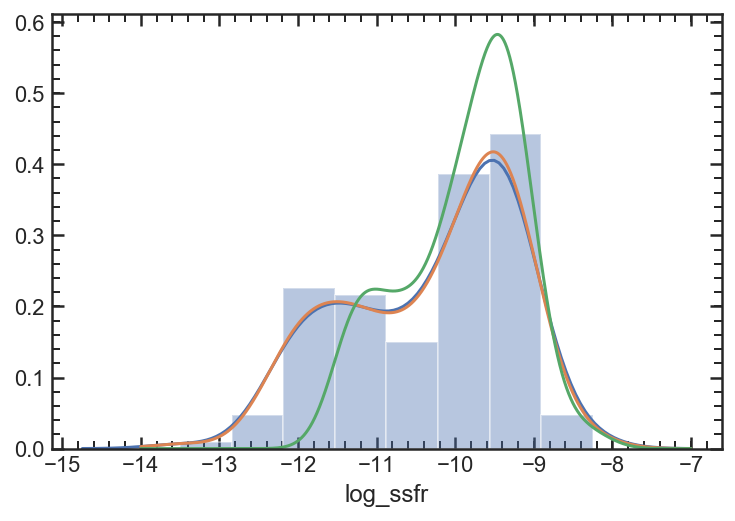

In [286]:
sea.distplot(Adb.query('1.1 <zgrism <1.4').log_ssfr)
kde =stats.gaussian_kde(Adb.query('1.1 <zgrism <1.4').log_ssfr)
plt.plot(X,kde(X))

kde =stats.gaussian_kde(Adb.query('1.1 <zgrism <1.4 and log_ssfr > -11.5').log_ssfr)
plt.plot(X,kde(X))

In [157]:
from scipy.ndimage import gaussian_filter as norm_kde

zgrism = Adb.sort_values('zgrism').zgrism.values
log_ssfr = Adb.sort_values('zgrism').log_ssfr.values
idx=0

Qs = []
Sf = []
Sp = []
zs = []

size = 0.5
step = 0.01
start = 0.7 - size/2
stop = 2.7 + size/2

DB = Adb

while (start + step*idx + size) < stop:
    zs.append(start + step*idx + size/2)
    
    llim = start + step*idx
    hlim = llim + size
    
    samp = DB.query('{} <zgrism < {}'.format(llim,hlim)).log_ssfr.values
    subsamp =  DB.query('{} <zgrism < {} and log_ssfr > -11.5'.format(llim,hlim)).log_ssfr.values

#     y,x=np.histogram(subsamp,50)
#     x=(x[1:]+x[:-1])/2 # for len(x)==len(y)

    kde =stats.gaussian_kde(subsamp)
    y = kde(X)
    x = X
    
    
    mug1 = max1 = mug2 = max2 = 0
    for ii in range(len(x)):
        if x[ii] < -10.3:
            if y[ii] > max1:
                mug1 = x[ii]
                max1 = y[ii]  

        if x[ii] > -10.3:
            if y[ii] > max2:
                mug2 = x[ii]
                max2 = y[ii] 
    expected =[mug2,.1, max2],

    params,cov=curve_fit(gauss,x,y,expected)
    
    sigma=np.sqrt(np.diag(cov))
    mu2, sig2, A2 = params
    
    X = np.linspace(-14, -7, 1000)
    SFdist = gauss(X, mu2, sig2, A2)
    Sf.append(SFdist)

    kde =stats.gaussian_kde(samp)

    kde_n = (kde(X)/max(kde(X)) * max(SFdist))
    Sint = []
    Fint = []
    
    for ii in range(len(X)):
        Sint.append(np.trapz(SFdist[ii:ii+2],X[ii:ii+2]))    
        Fint.append(np.trapz(kde_n[ii:ii+2],X[ii:ii+2]))    


    SFprob = interp1d(X,np.array(Sint) / np.array(Fint))
    
    Sp_n = []
    val = 0
    switch = False
    sp = np.zeros_like(SFprob(X))
    for ii in range(len(SFprob(X))):
        if val >0.9999:
            switch = True
        else:
            val = SFprob(X)[ii]  
        sp[ii] = SFprob(X)[ii]   
        if switch:
            sp[ii] = 1   
    sp[sp > 1]=1
    Sp.append(sp)
    idx += 1
    

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:69: RuntimeWarning: invalid value encountered in true_divide


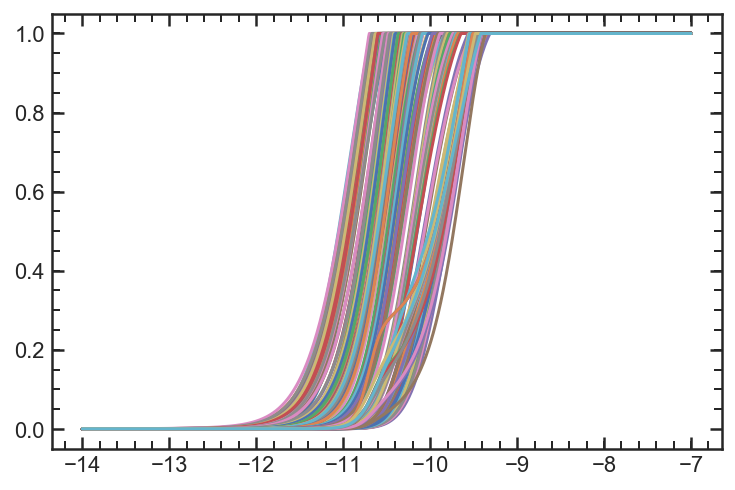

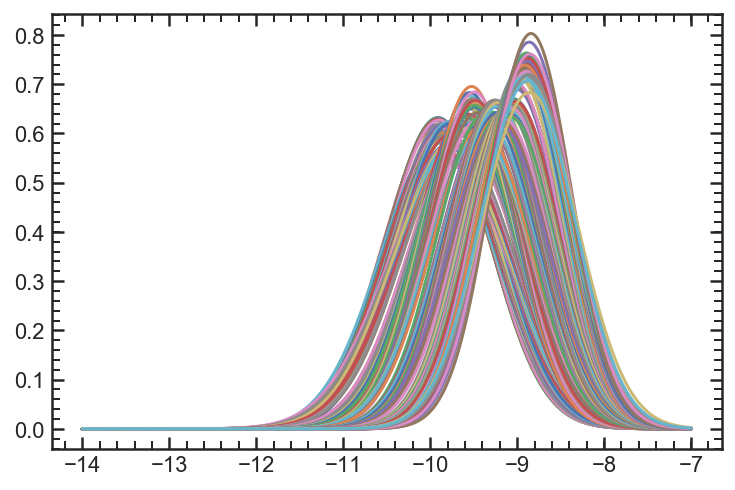

In [158]:
plt.figure()
for i in Sp:
    plt.plot(X,i)

plt.figure()
for i in Sf:
    plt.plot(X,i)

[0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0, 2.1, 2.2, 2.3, 2.4, 2.5, 2.6]


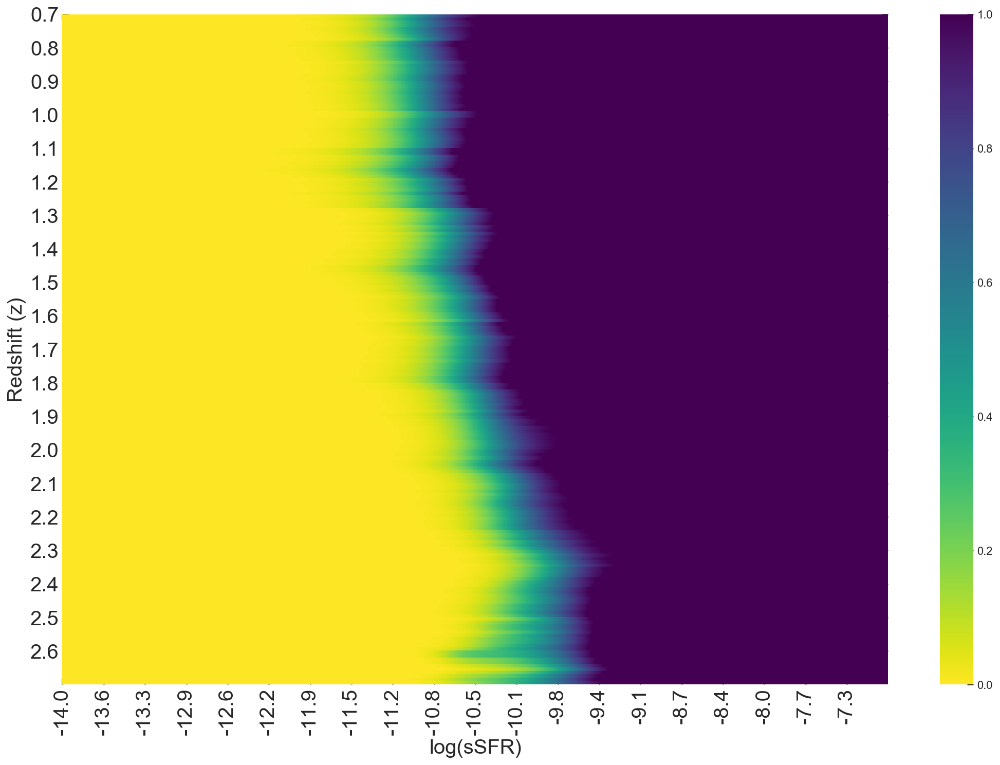

In [159]:
plt.figure(figsize=[18,12])
sea.heatmap(Sp, cmap='viridis_r')
# plt.yticks(zs)

ynum = np.arange(0,len(zs),10)
znum = []

xnum = np.arange(0,len(X),50)
snum = []

for i in range(len(ynum)):
    znum.append(np.round(zs[ynum[i]],2))
for i in range(len(xnum)):
    snum.append(np.round(X[xnum[i]],1))
    
plt.yticks(ynum,znum)
plt.xticks(xnum,snum)

print(znum)

plt.ylabel('Redshift (z)',size=20)
plt.xlabel('log(sSFR)',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.savefig('../plots/research_update/Psf_2.png', bbox_inches = 'tight')    

In [160]:
iSprob = interp2d(X,zs,Sp)

Z = np.linspace(0.7,2.7,500)
M = []
L = []
H = []
for i in range(len(Z)):
    mt = lt = ht = False
    for x in X:
        if not mt and 0.49 < iSprob(x,Z[i]) < 0.51:
            M.append(x)
            mt = True
        if not lt and 0.19 < iSprob(x,Z[i]) < 0.21:
            L.append(x)
            lt = True
        if not ht and 0.79 < iSprob(x,Z[i]) < 0.81:
            H.append(x)
            ht = True
            
sfp = []
for i in Adb.index:
    sfp.append(iSprob(Adb.log_ssfr[i],Adb.zgrism[i])[0])
    
Adb['sf_prob_2'] = sfp

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


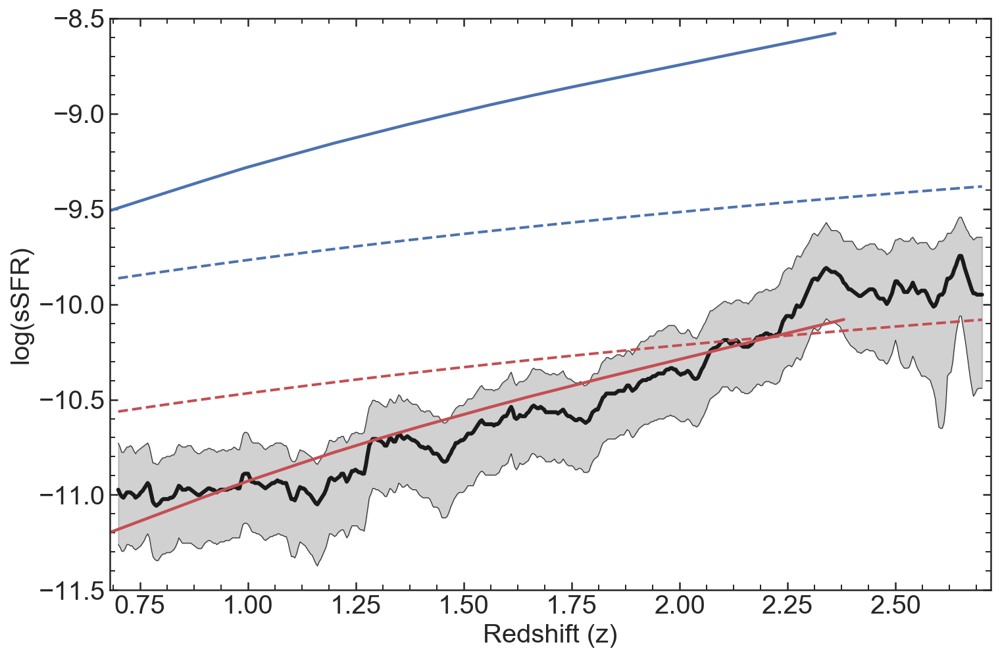

In [161]:
plt.figure(figsize=[12,8])

plt.plot(Z,M, 'k', linewidth = 3)
plt.plot(Z,L, 'k', linewidth = .5)
plt.plot(Z,H, 'k', linewidth = .5)
plt.fill_between(Z,L,H,color = 'k', alpha = 0.2)

plt.xlabel('Redshift (z)',size=20)
plt.ylabel('log(sSFR)',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)

# sea.regplot(Z,M, lowess=True, scatter = False, color = 'k')
# sea.regplot(Z,L, lowess=True, scatter = False, color = 'k')
# sea.regplot(Z,H, lowess=True, scatter = False, color = 'k')

X = [0.320,0.409,0.560,0.653,0.747,0.853,0.904,0.995,1.10,1.20,1.37,1.46,1.56,1.66,1.74,1.81,1.90,1.9,2.10,2.19,2.36]  
Y  =[-9.82,-9.73,-9.60,-9.52,-9.45,-9.36,-9.33,-9.28,-9.21,-9.14,-9.05,-9.00,-8.95,-8.90,-8.87,-8.83,-8.78 ,-8.74,-8.69,-8.66,-8.59]
sea.regplot(X,Y, lowess = True, scatter = False, color = 'b')
X = [0.326,0.416,0.494,0.586,0.673,0.767,1.01,1.11,1.20,1.30,1.40,1.49,1.56,1.65,1.82,1.91,2.02,2.11,2.22,2.28,2.38,0.894 ] 
Y=[-11.5,-11.4,-11.4,-11.3,-11.2,-11.1,-10.9,-10.8, -10.8,-10.7,-10.6,-10.6,-10.5,-10.5,-10.4,-10.3,-10.3,-10.2,-10.2,-10.1,-10.1,-11.0]
sea.regplot(X,Y, lowess = True, scatter = False, color = 'r')

plt.plot(Z,np.log10(0.2/cosmo.age(Z).value)-9, '--r', linewidth = 2)
plt.plot(Z,np.log10(1/cosmo.age(Z).value)-9, '--b', linewidth = 2)

plt.xlim(0.68, 2.72)
plt.ylim(-11.5, -8.5)

plt.savefig('../plots/research_update/green_trend_3.png', bbox_inches = 'tight')    

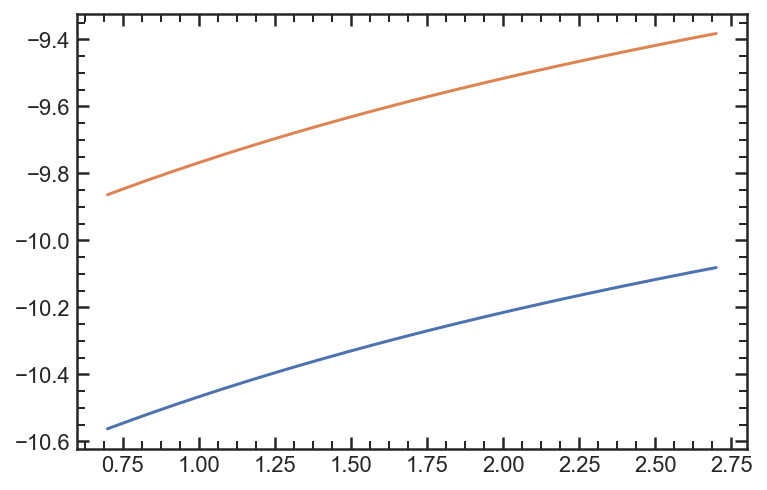

In [241]:
plt.plot(Z,np.log10(0.2/cosmo.age(Z).value)-9)
plt.plot(Z,np.log10(1/cosmo.age(Z).value)-9)

In [242]:
sfp = []
for i in Adb.index:
    sfp.append(iSprob(Adb.log_ssfr[i],Adb.zgrism[i])[0])
    
Adb['sf_prob_2'] = sfp

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


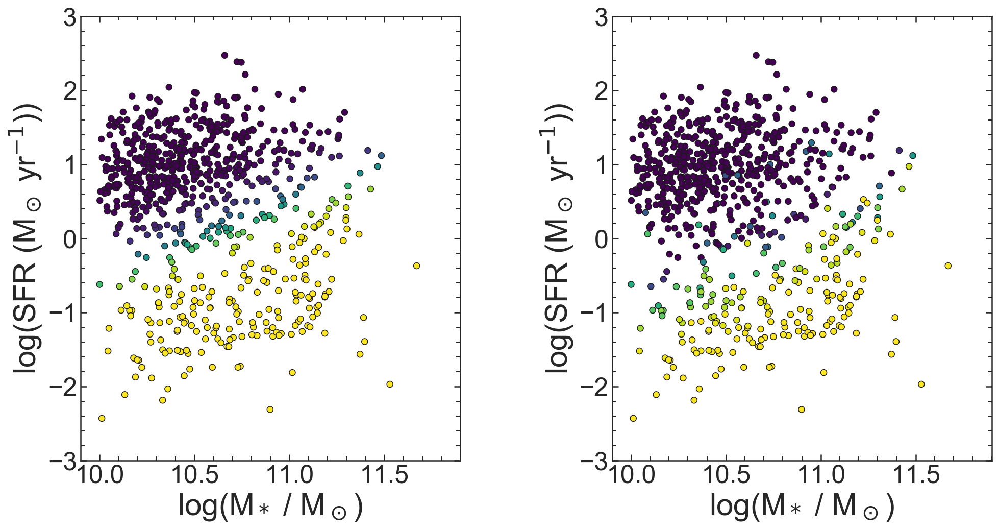

In [443]:
gs = gridspec.GridSpec(1,2,wspace=0.4)
plt.figure(figsize=[16,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

sea.scatterplot(Adb.lmass, Adb.log_sfr, hue = Adb.sf_prob.values, ax = ax1, legend = False, palette='viridis_r', edgecolor = 'k')
ax1.set_ylabel('log(SFR (M$_\odot$ yr$^{-1}$))', fontsize=30)
ax1.set_xlabel('log(M$_*$ / M$_\odot$)', fontsize=30)
ax1.tick_params(axis='both', which='major', labelsize=25)
ax1.set_xlim(9.9,11.9)
ax1.set_ylim(-3,3)
sea.scatterplot([-100],[-100], hue = [0], hue_norm = (0,1), ax = ax1, legend = False, label = '0.0', palette='viridis_r', edgecolor = 'k')
sea.scatterplot([-100],[-100], hue = [0.5], hue_norm = (0,1), ax = ax1, legend = False, label = '0.5', palette='viridis_r', edgecolor = 'k')
sea.scatterplot([-100],[-100], hue = [1], hue_norm = (0,1), ax = ax1, legend = False, label = '1.0', palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.lmass, Adb.log_sfr, hue = Adb.sf_prob_2.values, ax = ax2, legend = False, palette='viridis_r', edgecolor = 'k')
ax2.set_ylabel('log(SFR (M$_\odot$ yr$^{-1}$))', fontsize=30)
ax2.set_xlabel('log(M$_*$ / M$_\odot$)', fontsize=30)
ax2.tick_params(axis='both', which='major', labelsize=25)
ax2.set_xlim(9.9,11.9)
ax2.set_ylim(-3,3)
plt.savefig('../plots/research_update/compare_Psf.png', bbox_inches = 'tight')    

In [607]:
v4N = Table.read(fits.open('/Volumes/Vince_CLEAR/3dhst_V4.4/goodsn_3dhst.v4.4.cats/Eazy/goodsn_3dhst.v4.4.zout.fits'),
                 format='fits').to_pandas()
v4S = Table.read(fits.open('/Volumes/Vince_CLEAR/3dhst_V4.4/goodss_3dhst.v4.4.cats/Eazy/goodss_3dhst.v4.4.zout.fits'),
                 format='fits').to_pandas()

v4Ncat = Table.read('/Volumes/Vince_CLEAR/3dhst_V4.4/goodsn_3dhst.v4.4.cats/Catalog/goodsn_3dhst.v4.4.cat',
                 format='ascii').to_pandas()
v4Scat = Table.read('/Volumes/Vince_CLEAR/3dhst_V4.4/goodss_3dhst.v4.4.cats/Catalog/goodss_3dhst.v4.4.cat',
                 format='ascii').to_pandas()

v4N['use'] = v4Ncat['use_phot']
v4S['use'] = v4Scat['use_phot']

v4N['star'] = v4Ncat['class_star']
v4S['star'] = v4Scat['class_star']

v4N['f125'] = v4Ncat['f_F125W']
v4S['f125'] = v4Scat['f_F125W']

v4N['f160'] = v4Ncat['f_F160W']
v4S['f160'] = v4Scat['f_F160W']

filesN = glob('/Volumes/Vince_CLEAR/RELEASE_v2.1.0/*N*/*.1D.fits')
filesS = glob('/Volumes/Vince_CLEAR/RELEASE_v2.1.0/*S*/*.1D.fits')

allNids = [int(os.path.basename(U).replace('.1D.fits','').split('_')[1]) for U in filesN]
allSids = [int(os.path.basename(U).replace('.1D.fits','').split('_')[1]) for U in filesS]

Nids = np.array(list(set(allNids)))
Sids = np.array(list(set(allSids)))

Npresent = [U in Nids for U in v4N.id]
Spresent = [U in Sids for U in v4S.id]

v4N['grism'] = Npresent
v4S['grism'] = Spresent

def Color(band1, band2):
    m1=-2.5*np.log10(band1)
    m2=-2.5*np.log10(band2)
    return m1-m2

UV = []
VJ = []

for i in Adb.index:
    if Adb.field[i] == 'GND':
        UV.append(Color(v4N.query('id == {}'.format(Adb.id[i])).restU.values[0], v4N.query('id == {}'.format(Adb.id[i])).restV.values[0]))
        VJ.append(Color(v4N.query('id == {}'.format(Adb.id[i])).restV.values[0], v4N.query('id == {}'.format(Adb.id[i])).restJ.values[0])) 
        
    if Adb.field[i] == 'GSD':
        UV.append(Color(v4S.query('id == {}'.format(Adb.id[i])).restU.values[0], v4S.query('id == {}'.format(Adb.id[i])).restV.values[0]))
        VJ.append(Color(v4S.query('id == {}'.format(Adb.id[i])).restV.values[0], v4S.query('id == {}'.format(Adb.id[i])).restJ.values[0])) 

Adb['VJ'] = VJ
Adb['UV'] = UV

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


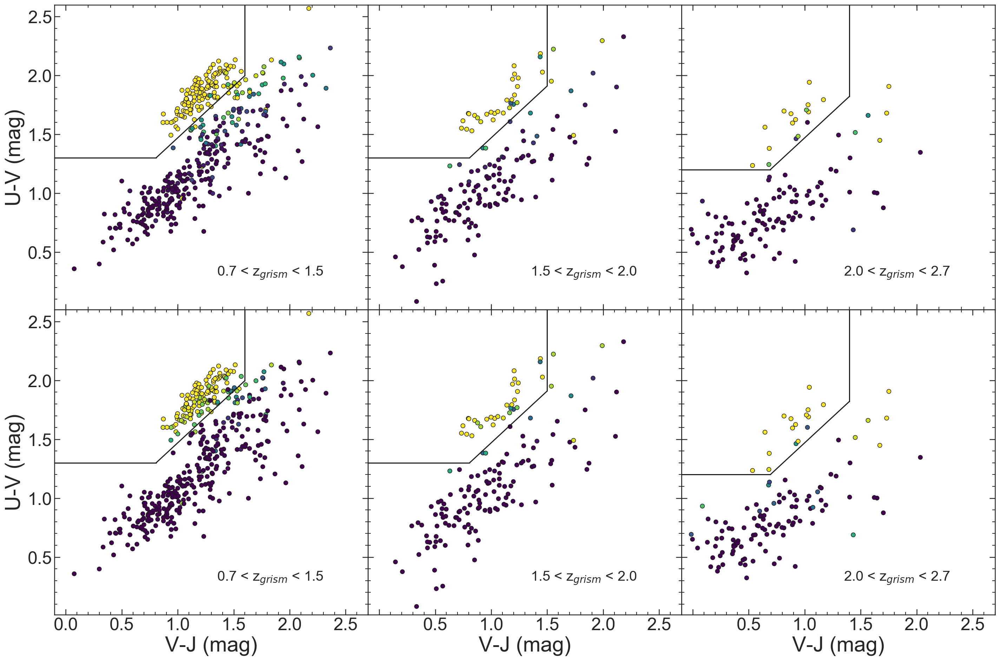

In [615]:
UVy = np.linspace(0,2.5)
VJx = np.linspace(-1,2.5)

iUVJ = interp1d(VJx, 0.88 * VJx +0.59)
invUVJ = interp1d(0.88 * VJx +0.59, VJx)

gs = gridspec.GridSpec(2,3, wspace=0,hspace=0)

plt.figure(figsize = [24, 16])

ax1 = plt.subplot(gs[0,0])
ax2 = plt.subplot(gs[0,1])
ax3 = plt.subplot(gs[0,2])
ax4 = plt.subplot(gs[1,0])
ax5 = plt.subplot(gs[1,1])
ax6 = plt.subplot(gs[1,2])

ax1.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax1.plot([1.6,1.6],[iUVJ(1.6),2.7], color = 'k')
ax1.plot([invUVJ(1.3),1.6],[1.3,iUVJ(1.6)], color = 'k')
sea.scatterplot(Adb.query('zgrism < 1.5').VJ, Adb.query('zgrism < 1.5').UV.values, 
                hue = Adb.query('zgrism < 1.5').sf_prob.values, hue_norm=(0,1), legend = False, ax = ax1, palette='viridis_r', edgecolor = 'k')

ax4.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax4.plot([1.6,1.6],[iUVJ(1.6),2.7], color = 'k')
ax4.plot([invUVJ(1.3),1.6],[1.3,iUVJ(1.6)], color = 'k')
sea.scatterplot(Adb.query('zgrism < 1.5').VJ, Adb.query('zgrism < 1.5').UV.values, 
                hue = Adb.query('zgrism < 1.5').sf_prob_2.values, hue_norm=(0,1), legend = False, ax = ax4, palette='viridis_r', edgecolor = 'k')
######################################
ax2.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax2.plot([1.5,1.5],[iUVJ(1.5),2.7], color = 'k')
ax2.plot([invUVJ(1.3),1.5],[1.3,iUVJ(1.5)], color = 'k')
sea.scatterplot(Adb.query('1.5 < zgrism < 2.0').VJ, Adb.query('1.5 < zgrism < 2.0').UV.values, 
                hue = Adb.query('1.5 < zgrism < 2.0').sf_prob.values, hue_norm=(0,1), legend = False, ax = ax2, palette='viridis_r', edgecolor = 'k')

ax5.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax5.plot([1.5,1.5],[iUVJ(1.5),2.7], color = 'k')
ax5.plot([invUVJ(1.3),1.5],[1.3,iUVJ(1.5)], color = 'k')
sea.scatterplot(Adb.query('1.5 < zgrism < 2.0').VJ, Adb.query('1.5 < zgrism < 2.0').UV.values, 
                hue = Adb.query('1.5 < zgrism < 2.0').sf_prob_2.values, hue_norm=(0,1), legend = False, ax = ax5, palette='viridis_r', edgecolor = 'k')
############################################
ax3.plot([-1,invUVJ(1.2)],[1.2,1.2], color = 'k')
ax3.plot([1.4,1.4],[iUVJ(1.4),2.7], color = 'k')
ax3.plot([invUVJ(1.2),1.4],[1.2,iUVJ(1.4)], color = 'k')
sea.scatterplot(Adb.query('2.0 < zgrism < 3.5').VJ, Adb.query('2.0 < zgrism < 3.5').UV.values, 
                hue = Adb.query('2.0 < zgrism < 3.5').sf_prob.values, hue_norm=(0,1), legend = False, ax = ax3, palette='viridis_r', edgecolor = 'k')

ax6.plot([-1,invUVJ(1.2)],[1.2,1.2], color = 'k')
ax6.plot([1.4,1.4],[iUVJ(1.4),2.7], color = 'k')
ax6.plot([invUVJ(1.2),1.4],[1.2,iUVJ(1.4)], color = 'k')
sea.scatterplot(Adb.query('2.0 < zgrism < 3.5').VJ, Adb.query('2.0 < zgrism < 3.5').UV.values, 
                hue = Adb.query('2.0 < zgrism < 3.5').sf_prob_2.values, hue_norm=(0,1), legend = False, ax = ax6, palette='viridis_r', edgecolor = 'k')

ax4.set_xlabel('V-J (mag)', fontsize=30)
ax5.set_xlabel('V-J (mag)', fontsize=30)
ax6.set_xlabel('V-J (mag)', fontsize=30)

ax1.set_ylabel('U-V (mag)', fontsize=30)
ax4.set_ylabel('U-V (mag)', fontsize=30)

ax4.set_xticks(np.arange(0,3,0.5))
ax4.set_xticklabels(np.arange(0,3,0.5))
ax5.set_xticks(np.arange(0,3,0.5))
ax5.set_xticklabels(['',0.5,1.0,1.5,2.0,2.5])
ax6.set_xticks(np.arange(0,3,0.5))
ax6.set_xticklabels(['',0.5,1.0,1.5,2.0,2.5])

ax2.set_yticks([0,0.5,1.0,1.5,2.0])
ax2.set_yticklabels([])
ax3.set_yticks([0,0.5,1.0,1.5,2.0])
ax3.set_yticklabels([])
ax5.set_yticks([0,0.5,1.0,1.5,2.0])
ax5.set_yticklabels([])
ax6.set_yticks([0,0.5,1.0,1.5,2.0])
ax6.set_yticklabels([])

ax1.minorticks_on()
ax2.minorticks_on()
ax3.minorticks_on()
ax4.minorticks_on()
ax5.minorticks_on()
ax6.minorticks_on()

ax1.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax4.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax5.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax6.tick_params(axis='both', which='major', labelsize=25, length = 8)

ax1.text(1.35, 0.3, '0.7 < z$_{grism}$ < 1.5', fontsize =20)
ax2.text(1.35, 0.3, '1.5 < z$_{grism}$ < 2.0', fontsize =20)
ax3.text(1.35, 0.3, '2.0 < z$_{grism}$ < 2.7', fontsize =20)
ax4.text(1.35, 0.3, '0.7 < z$_{grism}$ < 1.5', fontsize =20)
ax5.text(1.35, 0.3, '1.5 < z$_{grism}$ < 2.0', fontsize =20)
ax6.text(1.35, 0.3, '2.0 < z$_{grism}$ < 2.7', fontsize =20)

ax1.set_xlim(-0.1, 2.7)
ax2.set_xlim(-0.1, 2.7)
ax3.set_xlim(-0.1, 2.7)
ax4.set_xlim(-0.1, 2.7)
ax5.set_xlim(-0.1, 2.7)
ax6.set_xlim(-0.1, 2.7)

ax1.set_ylim(0.01,2.6)
ax2.set_ylim(0.01,2.6)
ax3.set_ylim(0.01,2.6)
ax4.set_ylim(0.01,2.6)
ax5.set_ylim(0.01,2.6)
ax6.set_ylim(0.01,2.6)
# ax1.legend( fontsize =20, loc = 2)
# ax3.legend( fontsize = 18)
plt.savefig('../plots/research_update/UVJ_1.png', bbox_inches = 'tight')    


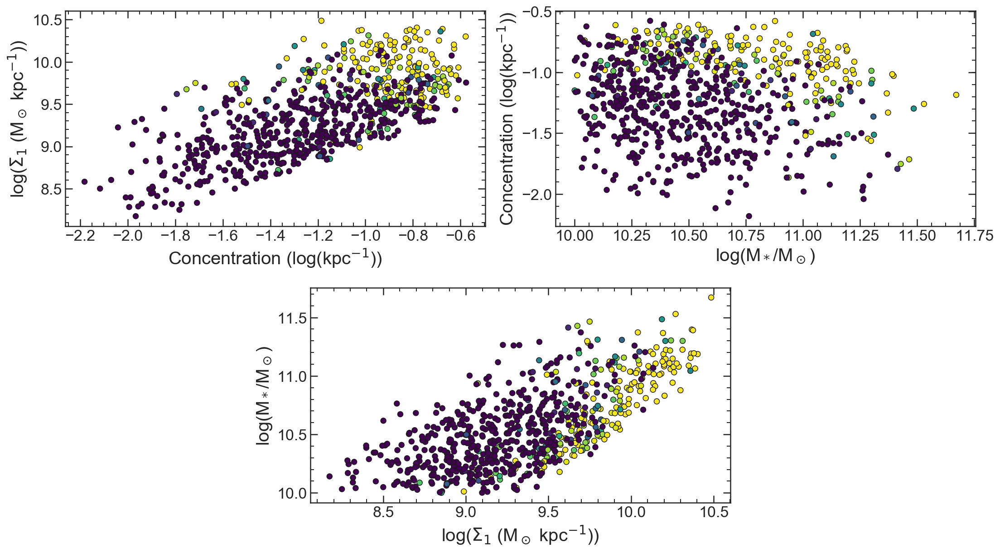

In [490]:
plt.figure(figsize=[18,10])
gs = gridspec.GridSpec(4,4, wspace = 0.4, hspace = 0.8)

ax1 = plt.subplot(gs[0:2,0:2])
ax2 = plt.subplot(gs[0:2,2:4])
ax3 = plt.subplot(gs[2:4,1:3])

sea.scatterplot(Adb.concen, Adb.log_Sigma1, ax = ax1, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.lmass, Adb.concen, ax = ax2, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.log_Sigma1, Adb.lmass, ax = ax3, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

ax1.set_ylabel('log($\Sigma_1$ (M$_\odot$ kpc$^{-1}$))', fontsize=20)
ax1.set_xlabel('Concentration (log(kpc$^{-1}$))', fontsize=20)
ax2.set_ylabel('Concentration (log(kpc$^{-1}$))', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax3.set_ylabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax3.set_xlabel('log($\Sigma_1$ (M$_\odot$ kpc$^{-1}$))', fontsize=20)

ax1.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=17, length = 8)

plt.savefig('../plots/research_update/morph_compare.png', bbox_inches = 'tight')    

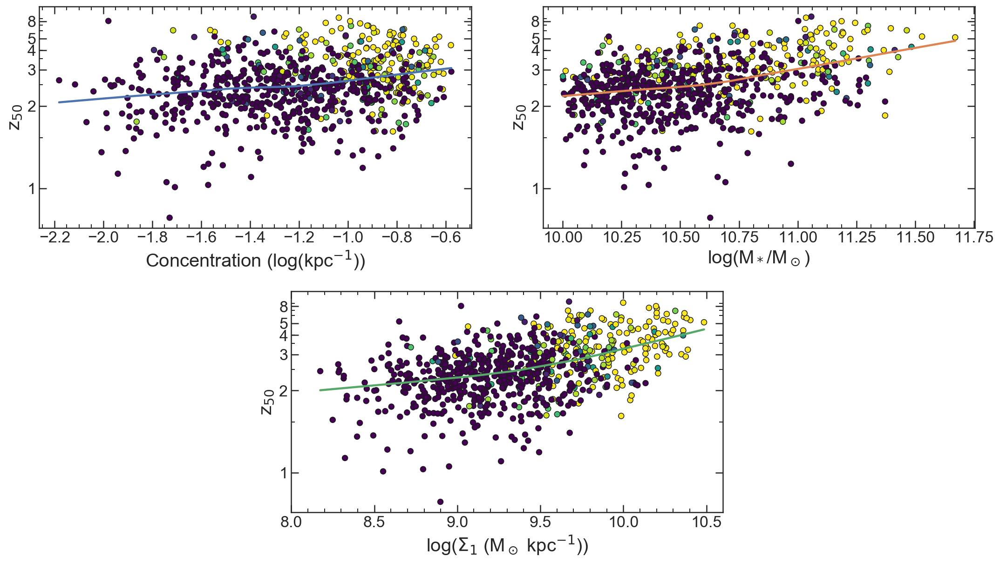

In [246]:
plt.figure(figsize=[18,10])
gs = gridspec.GridSpec(4,4, wspace = 0.4, hspace = 0.8)

ax1 = plt.subplot(gs[0:2,0:2])
ax2 = plt.subplot(gs[0:2,2:4])
ax3 = plt.subplot(gs[2:4,1:3])

sea.scatterplot(Adb.concen, Adb.z50, ax = ax1, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')
sea.regplot(Adb.concen, Adb.z50, ax = ax1, lowess = True, scatter = False)

sea.scatterplot(Adb.lmass, Adb.z50, ax = ax2, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')
sea.regplot(Adb.lmass, Adb.z50, ax = ax2, lowess = True, scatter = False)

sea.scatterplot(Adb.log_Sigma1, Adb.z50, ax = ax3, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')
sea.regplot(Adb.log_Sigma1, Adb.z50, ax = ax3, lowess = True, scatter = False)

ax1.set_ylabel('z$_{50}$', fontsize=20)
ax1.set_xlabel('Concentration (log(kpc$^{-1}$))', fontsize=20)
ax2.set_ylabel('z$_{50}$', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax3.set_ylabel('z$_{50}$', fontsize=20)
ax3.set_xlabel('log($\Sigma_1$ (M$_\odot$ kpc$^{-1}$))', fontsize=20)

ax1.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=17, length = 8)

ax1.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
ax1.set_yticklabels([1,2,3,4,5,8])
ax1.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)
ax2.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
ax2.set_yticklabels([1,2,3,4,5,8])
ax2.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)
ax3.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
ax3.set_yticklabels([1,2,3,4,5,8])
ax3.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)

ax3.set_xlim(8,10.6)

plt.savefig('../plots/research_update/morph_z50.png', bbox_inches = 'tight')    

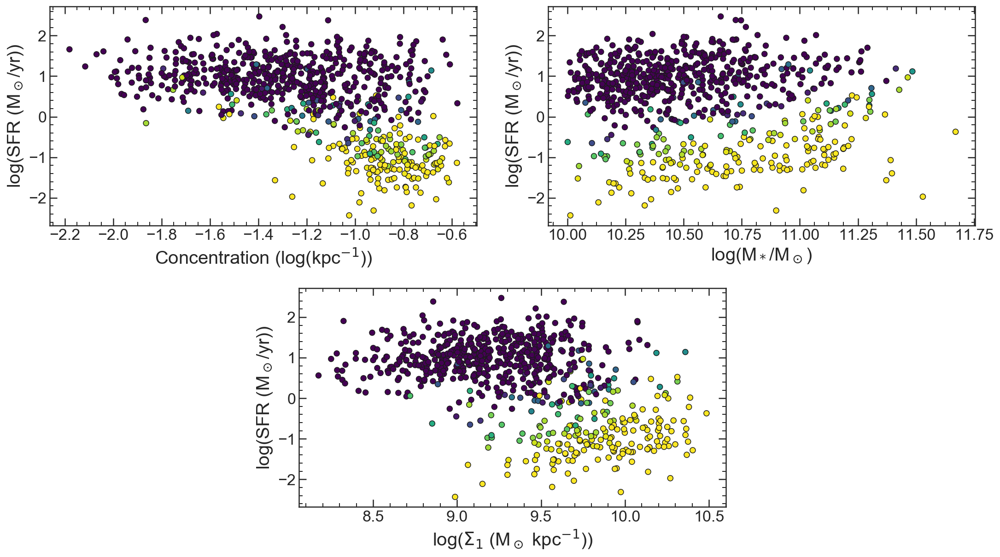

In [493]:
plt.figure(figsize=[18,10])
gs = gridspec.GridSpec(4,4, wspace = 0.4, hspace = 0.8)

ax1 = plt.subplot(gs[0:2,0:2])
ax2 = plt.subplot(gs[0:2,2:4])
ax3 = plt.subplot(gs[2:4,1:3])

sea.scatterplot(Adb.concen, Adb.log_sfr, ax = ax1, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.lmass, Adb.log_sfr, ax = ax2, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.log_Sigma1, Adb.log_sfr, ax = ax3, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

ax1.set_ylabel('log(SFR (M$_\odot$/yr))', fontsize=20)
ax1.set_xlabel('Concentration (log(kpc$^{-1}$))', fontsize=20)
ax2.set_ylabel('log(SFR (M$_\odot$/yr))', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax3.set_ylabel('log(SFR (M$_\odot$/yr))', fontsize=20)
ax3.set_xlabel('log($\Sigma_1$ (M$_\odot$ kpc$^{-1}$))', fontsize=20)

ax1.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=17, length = 8)

plt.savefig('../plots/research_update/morph_SFR.png', bbox_inches = 'tight')    

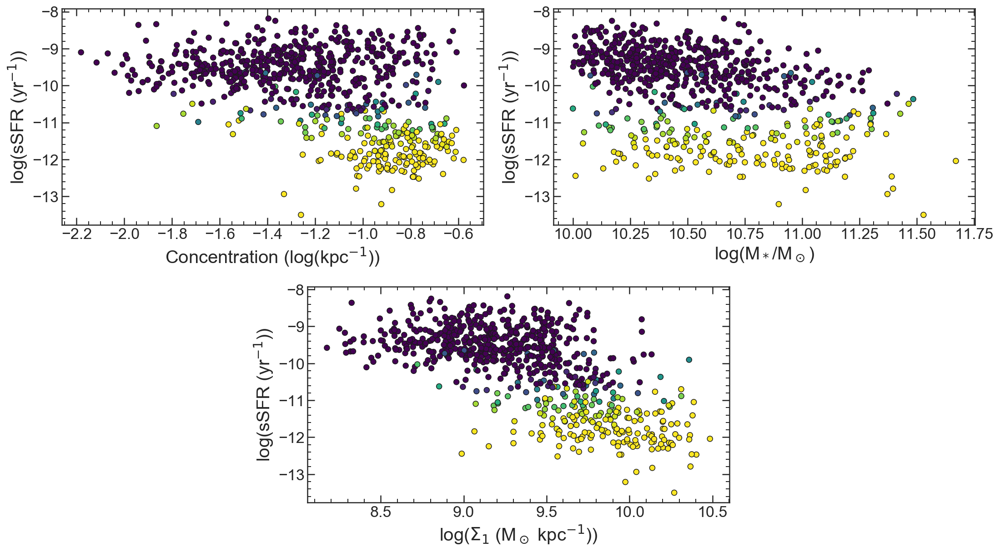

In [494]:
plt.figure(figsize=[18,10])
gs = gridspec.GridSpec(4,4, wspace = 0.4, hspace = 0.8)

ax1 = plt.subplot(gs[0:2,0:2])
ax2 = plt.subplot(gs[0:2,2:4])
ax3 = plt.subplot(gs[2:4,1:3])

sea.scatterplot(Adb.concen, Adb.log_ssfr, ax = ax1, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.lmass, Adb.log_ssfr, ax = ax2, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.log_Sigma1, Adb.log_ssfr, ax = ax3, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

ax1.set_ylabel('log(sSFR (yr$^{-1}$))', fontsize=20)
ax1.set_xlabel('Concentration (log(kpc$^{-1}$))', fontsize=20)
ax2.set_ylabel('log(sSFR (yr$^{-1}$))', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax3.set_ylabel('log(sSFR (yr$^{-1}$))', fontsize=20)
ax3.set_xlabel('log($\Sigma_1$ (M$_\odot$ kpc$^{-1}$))', fontsize=20)

ax1.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=17, length = 8)

plt.savefig('../plots/research_update/morph_sSFR.png', bbox_inches = 'tight')    

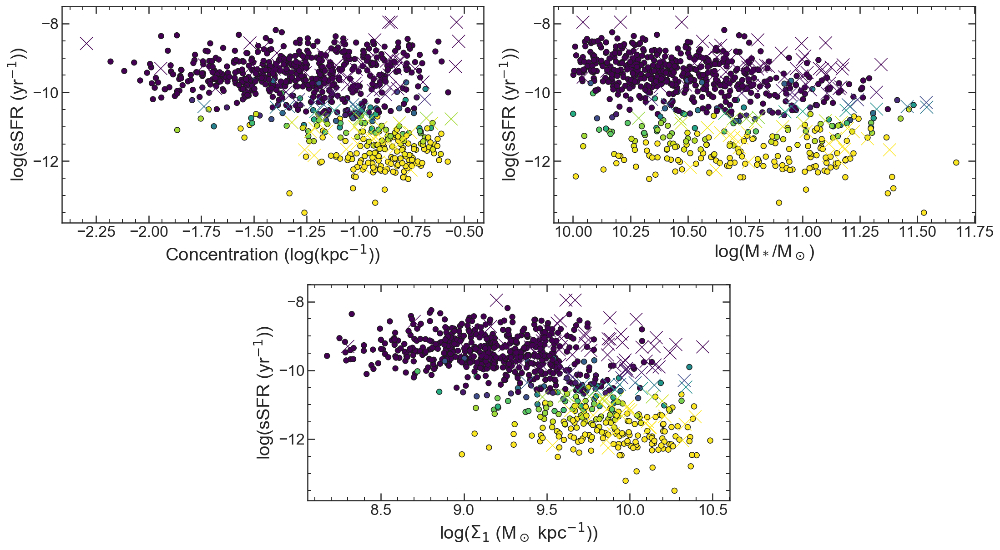

In [502]:
plt.figure(figsize=[18,10])
gs = gridspec.GridSpec(4,4, wspace = 0.4, hspace = 0.8)

ax1 = plt.subplot(gs[0:2,0:2])
ax2 = plt.subplot(gs[0:2,2:4])
ax3 = plt.subplot(gs[2:4,1:3])

sea.scatterplot(Adb.concen, Adb.log_ssfr, ax = ax1, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.lmass, Adb.log_ssfr, ax = ax2, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.log_Sigma1, Adb.log_ssfr, ax = ax3, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Axdb.concen, Axdb.log_ssfr, ax = ax1, hue = Axdb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k', marker = 'x', s = 200)

sea.scatterplot(Axdb.lmass, Axdb.log_ssfr, ax = ax2, hue = Axdb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k', marker = 'x', s = 200)

sea.scatterplot(Axdb.log_Sigma1, Axdb.log_ssfr, ax = ax3, hue = Axdb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k', marker = 'x', s = 200)

ax1.set_ylabel('log(sSFR (yr$^{-1}$))', fontsize=20)
ax1.set_xlabel('Concentration (log(kpc$^{-1}$))', fontsize=20)
ax2.set_ylabel('log(sSFR (yr$^{-1}$))', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax3.set_ylabel('log(sSFR (yr$^{-1}$))', fontsize=20)
ax3.set_xlabel('log($\Sigma_1$ (M$_\odot$ kpc$^{-1}$))', fontsize=20)

ax1.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=17, length = 8)

plt.savefig('../plots/research_update/morph_sSFR_xray.png', bbox_inches = 'tight')    

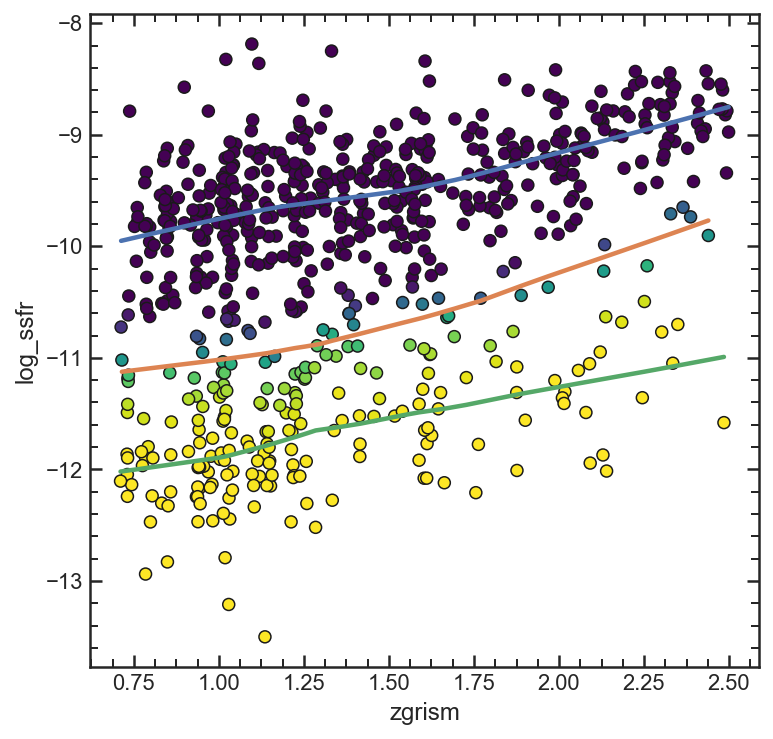

In [297]:
plt.figure(figsize=[6,6])
sea.scatterplot(Adb.zgrism, Adb.log_ssfr, hue = Adb.sf_prob_2.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.regplot(Adb.query('sf_prob_2 > 0.8').zgrism, Adb.query('sf_prob_2 > 0.8').log_ssfr, lowess=True, scatter = False)
sea.regplot(Adb.query('0.2 < sf_prob_2 < 0.8').zgrism, Adb.query('0.2 < sf_prob_2 < 0.8').log_ssfr, lowess=True, scatter = False)
sea.regplot(Adb.query('sf_prob_2 < 0.2').zgrism, Adb.query('sf_prob_2 < 0.2').log_ssfr, lowess=True, scatter = False)


In [376]:
len(adb)

1173

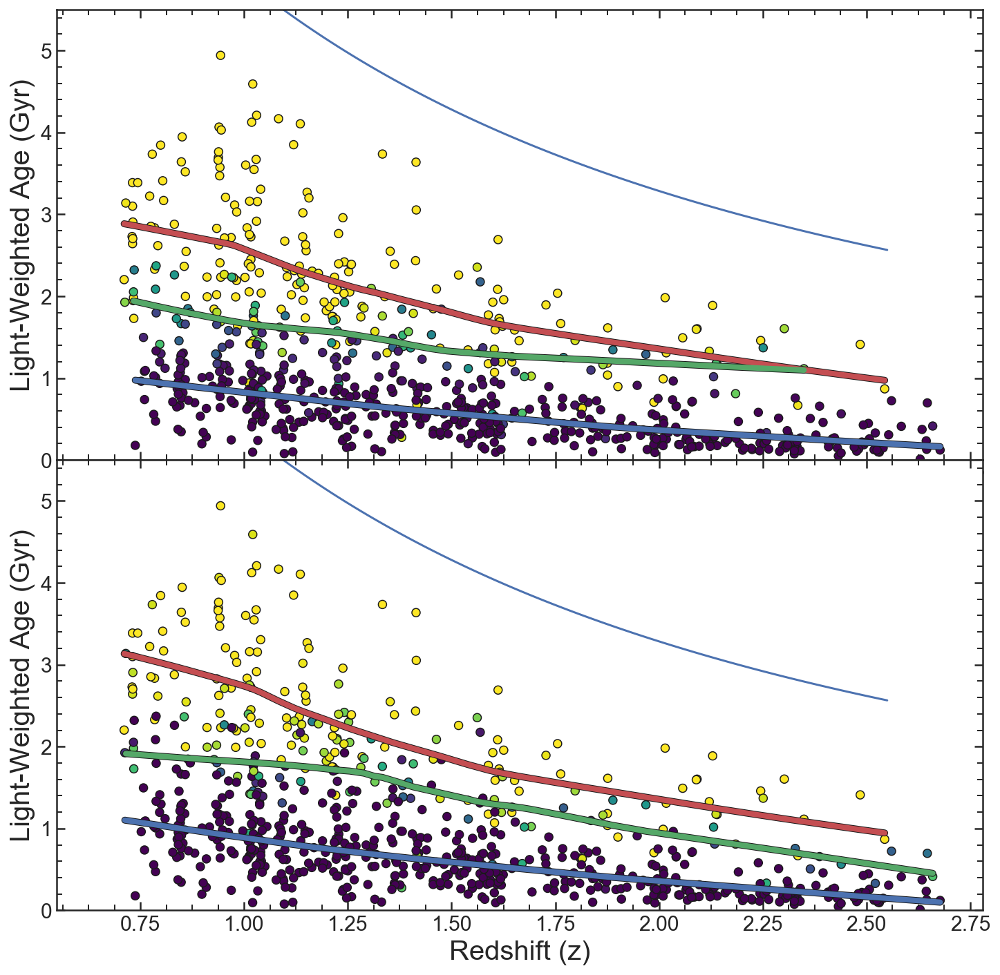

In [454]:
gs = gridspec.GridSpec(2,1,hspace=0)

plt.figure(figsize=[12,12])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

sea.scatterplot(Adb.zgrism,Adb.lwa, hue = Adb.sf_prob, legend=False, palette='viridis_r', edgecolor = 'k',ax =ax1)

zs = np.linspace(0.65,2.55,100)
ax1.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5},ax = ax1)
sea.regplot(Adb.query('0.2< sf_prob < 0.8').zgrism,Adb.query('0.2< sf_prob < 0.8').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5},ax = ax1)
sea.regplot(Adb.query('sf_prob > 0.8').zgrism,Adb.query('sf_prob > 0.8').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5},ax = ax1)


sea.regplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').lwa,
            lowess = True, color = 'r', scatter = False, line_kws = {'linewidth':4},ax = ax1)
sea.regplot(Adb.query('0.2< sf_prob < 0.8').zgrism,Adb.query('0.2< sf_prob < 0.8').lwa,
            lowess = True, color = 'g', scatter = False, line_kws = {'linewidth':4},ax = ax1)
sea.regplot(Adb.query('sf_prob > 0.8').zgrism,Adb.query('sf_prob > 0.8').lwa,
            lowess = True, color = 'b', scatter = False, line_kws = {'linewidth':4},ax = ax1)
ax1.set_ylim(0,5.5)


sea.scatterplot(Adb.zgrism,Adb.lwa, hue = Adb.sf_prob_2, legend=False, palette='viridis_r', edgecolor = 'k',ax =ax2)

zs = np.linspace(0.65,2.55,100)
ax2.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('sf_prob_2 < 0.2').zgrism,Adb.query('sf_prob_2 < 0.2').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5}, ax =ax2)
sea.regplot(Adb.query('0.2< sf_prob_2 < 0.8').zgrism,Adb.query('0.2< sf_prob_2 < 0.8').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5}, ax =ax2)
sea.regplot(Adb.query('sf_prob_2 > 0.8').zgrism,Adb.query('sf_prob_2 > 0.8').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5}, ax =ax2)


sea.regplot(Adb.query('sf_prob_2 < 0.2').zgrism,Adb.query('sf_prob_2 < 0.2').lwa,
            lowess = True, color = 'r', scatter = False, line_kws = {'linewidth':4}, ax =ax2)
sea.regplot(Adb.query('0.2< sf_prob_2 < 0.8').zgrism,Adb.query('0.2< sf_prob_2 < 0.8').lwa,
            lowess = True, color = 'g', scatter = False, line_kws = {'linewidth':4}, ax =ax2)
sea.regplot(Adb.query('sf_prob_2 > 0.8').zgrism,Adb.query('sf_prob_2 > 0.8').lwa,
            lowess = True, color = 'b', scatter = False, line_kws = {'linewidth':4}, ax =ax2)
ax2.set_ylim(0,5.5)
ax2.set_ylabel('Light-Weighted Age (Gyr)', fontsize=20)
ax2.set_xlabel('Redshift (z)', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=15)
ax1.set_ylabel('Light-Weighted Age (Gyr)', fontsize=20)
ax1.tick_params(axis='y', which='major', labelsize=15)

plt.savefig('../plots/research_update/lwa_dist_2.png', bbox_inches = 'tight')    

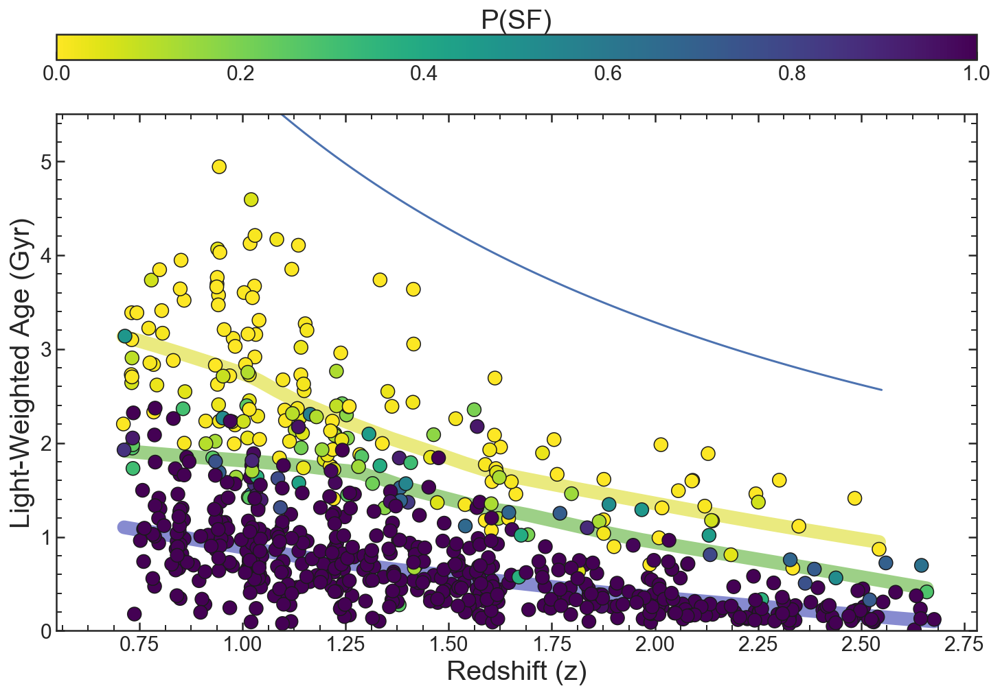

In [552]:
gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

norm = mpl.colors.Normalize(vmin=0, vmax =1)
mpl.colorbar.ColorbarBase(ax1, cmap = 'viridis_r', norm=norm, orientation='horizontal')
plt.tick_params(axis='both', which='major', labelsize=25)
ax1.xaxis.set_label_position('top')
ax1.set_xlabel('P(SF)', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)

sea.scatterplot(Adb.zgrism,Adb.lwa, hue = Adb.sf_prob_2, legend=False, palette='viridis_r', edgecolor = 'k', zorder=2, s=100,ax=ax2)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('sf_prob_2 < 0.2').zgrism,Adb.query('sf_prob_2 < 0.2').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'#D6D600'},ax=ax2)
sea.regplot(Adb.query('0.2< sf_prob_2 < 0.8').zgrism,Adb.query('0.2< sf_prob_2 < 0.8').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'#3DA310'},ax=ax2)
sea.regplot(Adb.query('sf_prob_2 > 0.8').zgrism,Adb.query('sf_prob_2 > 0.8').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'#1018A3'},ax=ax2)

plt.ylim(0,5.5)
plt.ylabel('Light-Weighted Age (Gyr)', fontsize=20)
plt.xlabel('Redshift (z)', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)

plt.savefig('../plots/research_update/lwa.png', bbox_inches = 'tight')    


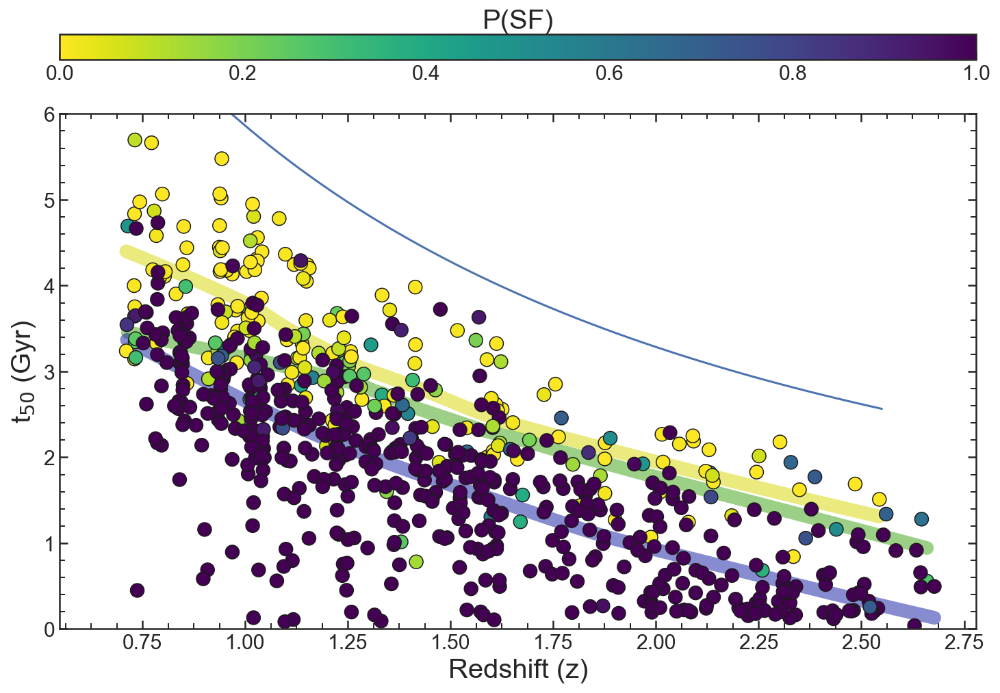

In [551]:
gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

norm = mpl.colors.Normalize(vmin=0, vmax =1)
mpl.colorbar.ColorbarBase(ax1, cmap = 'viridis_r', norm=norm, orientation='horizontal')
plt.tick_params(axis='both', which='major', labelsize=25)
ax1.xaxis.set_label_position('top')
ax1.set_xlabel('P(SF)', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)

sea.scatterplot(Adb.zgrism,Adb.t_50, hue = Adb.sf_prob_2, legend=False, palette='viridis_r', edgecolor = 'k', zorder=2, s=100,ax = ax2)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('sf_prob_2 < 0.2').zgrism,Adb.query('sf_prob_2 < 0.2').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'#D6D600'},ax = ax2)
sea.regplot(Adb.query('0.2< sf_prob_2 < 0.8').zgrism,Adb.query('0.2< sf_prob_2 < 0.8').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'#3DA310'},ax = ax2)
sea.regplot(Adb.query('sf_prob_2 > 0.8').zgrism,Adb.query('sf_prob_2 > 0.8').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'#1018A3'},ax = ax2)

plt.ylim(0,6)
plt.ylabel('t$_{50}$ (Gyr)', fontsize=20)
plt.xlabel('Redshift (z)', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)

plt.savefig('../plots/research_update/t50.png', bbox_inches = 'tight')    


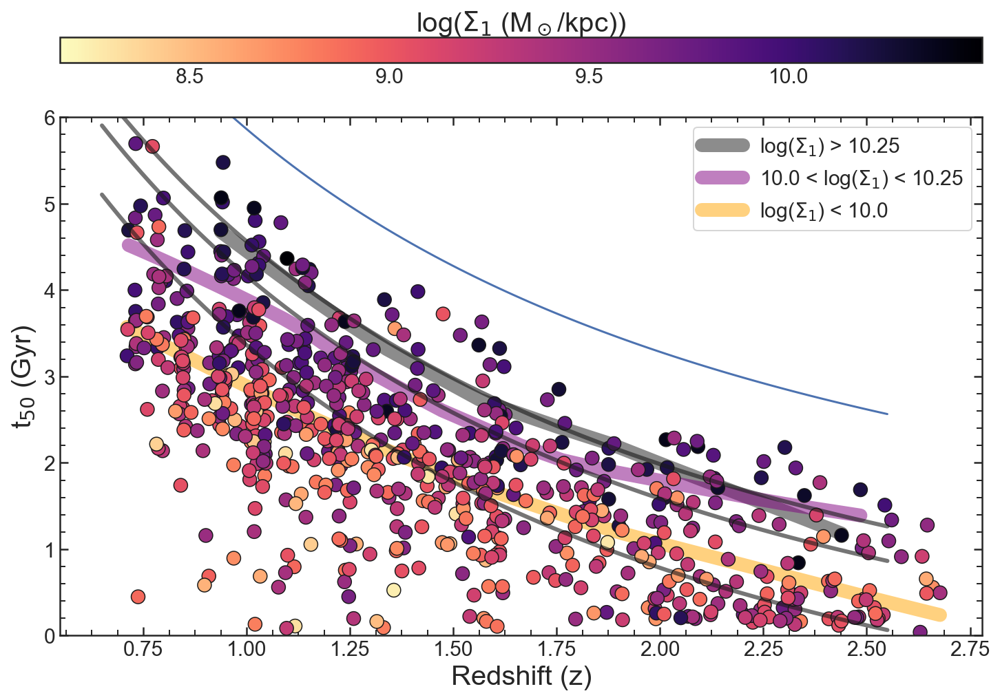

In [553]:
gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

norm = mpl.colors.Normalize(vmin=min(Adb.log_Sigma1), vmax = max(Adb.log_Sigma1))
mpl.colorbar.ColorbarBase(ax1, cmap = 'magma_r', norm=norm, orientation='horizontal')
plt.tick_params(axis='both', which='major', labelsize=25)
ax1.xaxis.set_label_position('top')
ax1.set_xlabel('log($\Sigma_1$ (M$_\odot$/kpc))', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)


sea.scatterplot(Adb.zgrism,Adb.t_50, hue = Adb.log_Sigma1, legend=False, palette='magma_r', edgecolor = 'k', zorder=2, s=100, ax = ax2)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('log_Sigma1 > 10.25').zgrism,Adb.query('log_Sigma1 > 10.25').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'k'},
           label = 'log($\Sigma_1$) > 10.25')
sea.regplot(Adb.query('10 < log_Sigma1 < 10.25').zgrism,Adb.query('10 < log_Sigma1 < 10.25').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'purple'},
           label = '10.0 < log($\Sigma_1$) < 10.25')
sea.regplot(Adb.query('log_Sigma1 < 10').zgrism,Adb.query('log_Sigma1 < 10').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'orange'},
           label = 'log($\Sigma_1$) < 10.0')

plt.ylim(0,6)
plt.ylabel('t$_{50}$ (Gyr)', fontsize=20)
plt.xlabel('Redshift (z)', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(fontsize = 15)
plt.plot(zs, cosmo.age(zs).value-1.3, 'k', linewidth = 3, alpha = 0.6)
plt.plot(zs, cosmo.age(zs).value-1.7, 'k', linewidth = 3, alpha = 0.6)
plt.plot(zs, cosmo.age(zs).value-2.5, 'k', linewidth = 3, alpha = 0.6)

plt.savefig('../plots/research_update/t50_Sigma1.png', bbox_inches = 'tight')    


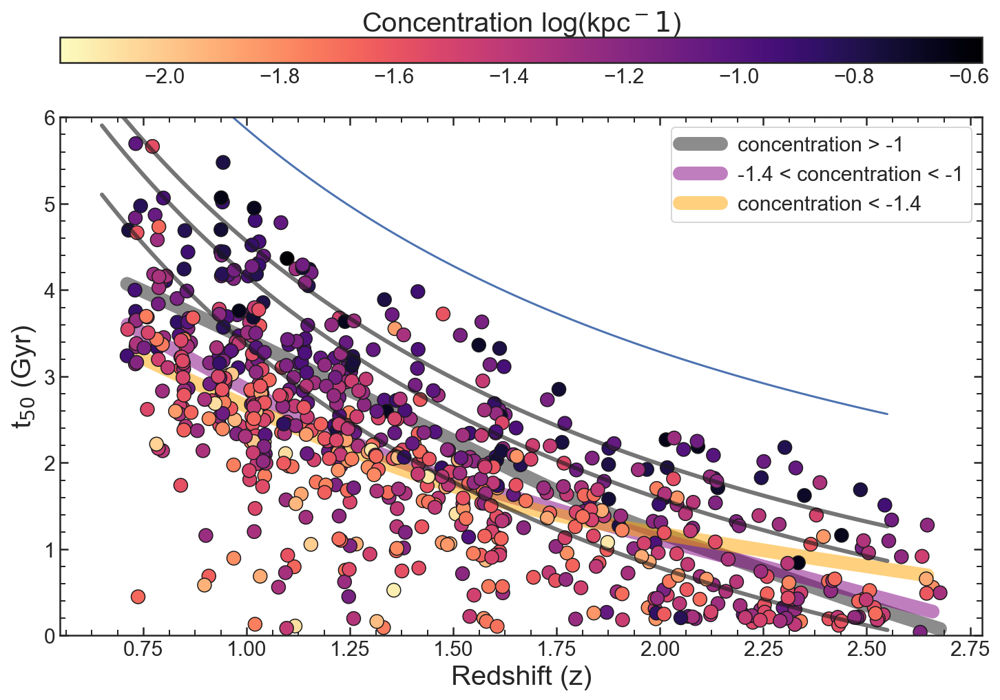

In [597]:
gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

norm = mpl.colors.Normalize(vmin=min(Adb.concen), vmax = max(Adb.concen))
mpl.colorbar.ColorbarBase(ax1, cmap = 'magma_r', norm=norm, orientation='horizontal')
plt.tick_params(axis='both', which='major', labelsize=25)
ax1.xaxis.set_label_position('top')
ax1.set_xlabel('Concentration log(kpc$^-1$)', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)


sea.scatterplot(Adb.zgrism,Adb.t_50, hue = Adb.log_Sigma1, legend=False, palette='magma_r', edgecolor = 'k', zorder=2, s=100, ax = ax2)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('concen > -1').zgrism,Adb.query('concen > -1').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'k'},
           label = 'concentration > -1')
sea.regplot(Adb.query('-1.4 < concen < -1').zgrism,Adb.query('-1.4 < concen < -1').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'purple'},
           label = '-1.4 < concentration < -1')
sea.regplot(Adb.query('concen < -1.4').zgrism,Adb.query('concen < -1.4').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'orange'},
           label = 'concentration < -1.4')

plt.ylim(0,6)
plt.ylabel('t$_{50}$ (Gyr)', fontsize=20)
plt.xlabel('Redshift (z)', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(fontsize = 15)
plt.plot(zs, cosmo.age(zs).value-1.3, 'k', linewidth = 3, alpha = 0.6)
plt.plot(zs, cosmo.age(zs).value-1.7, 'k', linewidth = 3, alpha = 0.6)
plt.plot(zs, cosmo.age(zs).value-2.5, 'k', linewidth = 3, alpha = 0.6)

# plt.savefig('../plots/research_update/t50_Sigma1.png', bbox_inches = 'tight')    


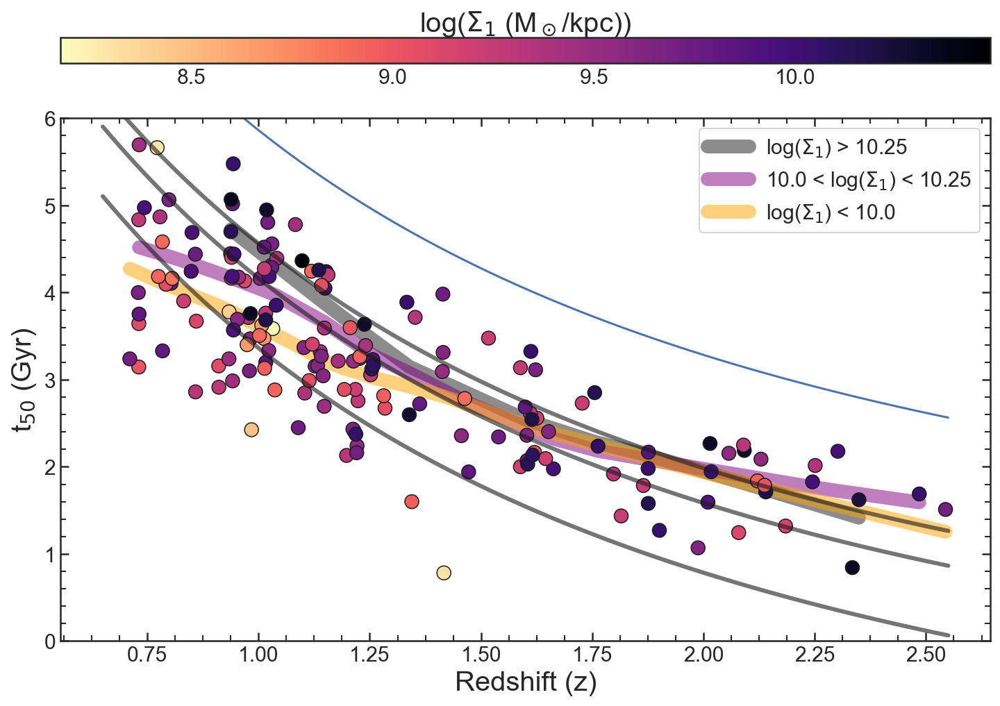

In [554]:
gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

norm = mpl.colors.Normalize(vmin=min(Adb.log_Sigma1), vmax = max(Adb.log_Sigma1))
mpl.colorbar.ColorbarBase(ax1, cmap = 'magma_r', norm=norm, orientation='horizontal')
plt.tick_params(axis='both', which='major', labelsize=25)
ax1.xaxis.set_label_position('top')
ax1.set_xlabel('log($\Sigma_1$ (M$_\odot$/kpc))', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)


sea.scatterplot(Adb.query('sf_prob_2 < 0.2').zgrism,Adb.query('sf_prob_2 < 0.2').t_50, 
                hue = Adb.query('sf_prob_2 < 0.2').log_Sigma1, legend=False, palette='magma_r', edgecolor = 'k', zorder=2, s=100, ax = ax2)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('log_Sigma1 > 10.25 and sf_prob_2 < 0.2').zgrism,Adb.query('log_Sigma1 > 10.25 and sf_prob_2 < 0.2').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'k'},
           label = 'log($\Sigma_1$) > 10.25')
sea.regplot(Adb.query('10 < log_Sigma1 < 10.25 and sf_prob_2 < 0.2').zgrism,Adb.query('10 < log_Sigma1 < 10.25 and sf_prob_2 < 0.2').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'purple'},
           label = '10.0 < log($\Sigma_1$) < 10.25')
sea.regplot(Adb.query('log_Sigma1 < 10 and sf_prob_2 < 0.2').zgrism,Adb.query('log_Sigma1 < 10 and sf_prob_2 < 0.2').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'orange'},
           label = 'log($\Sigma_1$) < 10.0')

plt.ylim(0,6)
plt.ylabel('t$_{50}$ (Gyr)', fontsize=20)
plt.xlabel('Redshift (z)', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(fontsize = 15)
plt.plot(zs, cosmo.age(zs).value-1.3, 'k', linewidth = 3, alpha = 0.6)
plt.plot(zs, cosmo.age(zs).value-1.7, 'k', linewidth = 3, alpha = 0.6)
plt.plot(zs, cosmo.age(zs).value-2.5, 'k', linewidth = 3, alpha = 0.6)

plt.savefig('../plots/research_update/t50_Sigma1_Q.png', bbox_inches = 'tight')    


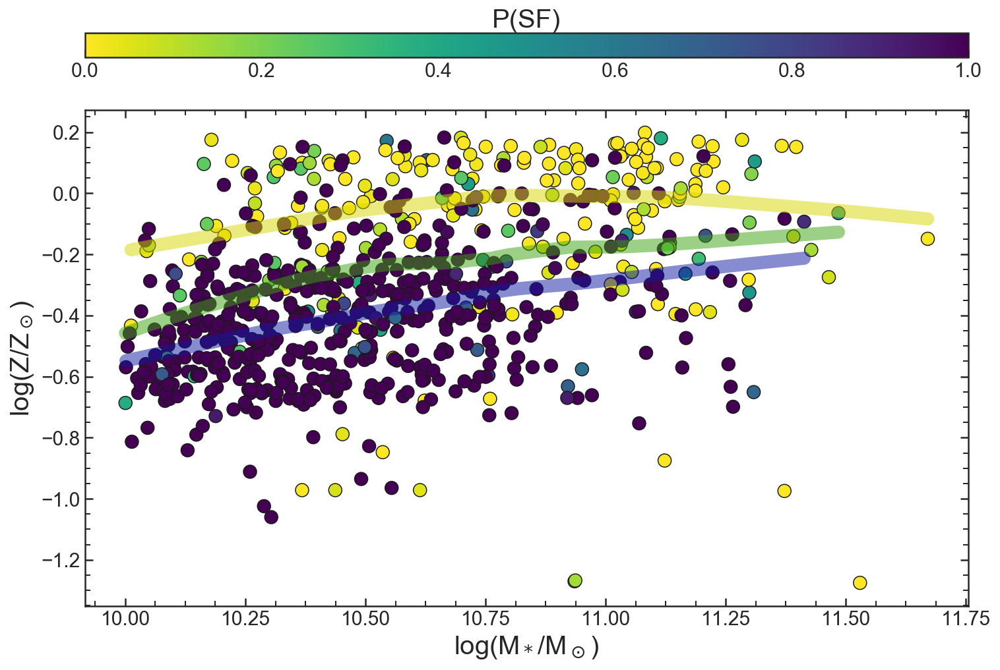

In [569]:
gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

norm = mpl.colors.Normalize(vmin=0, vmax =1)
mpl.colorbar.ColorbarBase(ax1, cmap = 'viridis_r', norm=norm, orientation='horizontal')
plt.tick_params(axis='both', which='major', labelsize=25)
ax1.xaxis.set_label_position('top')
ax1.set_xlabel('P(SF)', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)

sea.scatterplot(Adb.lmass,Adb.log_Z, hue = Adb.sf_prob_2, legend=False, palette='viridis_r', edgecolor = 'k', zorder=2, s=100,ax=ax2)

sea.regplot(Adb.query('sf_prob_2 < 0.2').lmass,Adb.query('sf_prob_2 < 0.2').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':3,'color':'#D6D600'},ax=ax2)
sea.regplot(Adb.query('0.2< sf_prob_2 < 0.8').lmass,Adb.query('0.2< sf_prob_2 < 0.8').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':3,'color':'#3DA310'},ax=ax2)
sea.regplot(Adb.query('sf_prob_2 > 0.8').lmass,Adb.query('sf_prob_2 > 0.8').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':10, 'alpha':0.5,'zorder':3,'color':'#1018A3'},ax=ax2)
ax2.set_ylabel('log(Z/Z$_\odot$)', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=15)
plt.savefig('../plots/research_update/mass_metal.png', bbox_inches = 'tight')    


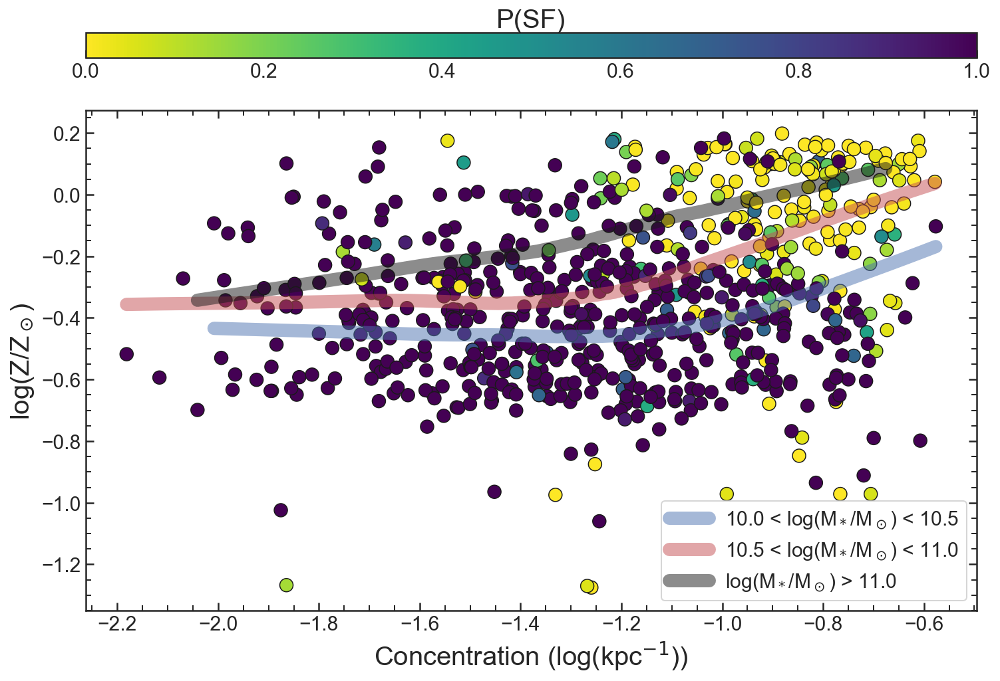

In [606]:
lims= [10,10.5,11,11.7]

gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

norm = mpl.colors.Normalize(vmin=0, vmax =1)
mpl.colorbar.ColorbarBase(ax1, cmap = 'viridis_r', norm=norm, orientation='horizontal')
plt.tick_params(axis='both', which='major', labelsize=25)
ax1.xaxis.set_label_position('top')
ax1.set_xlabel('P(SF)', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)

cols = ['b','r','k']
sea.scatterplot(Adb.concen, Adb.log_Z, hue = Adb.sf_prob_2, legend=False, palette='viridis_r',ax = ax2, edgecolor = 'k', zorder=2, s=100)

labels = ['10.0 < log(M$_*$/M$_\odot$) < 10.5','10.5 < log(M$_*$/M$_\odot$) < 11.0','log(M$_*$/M$_\odot$) > 11.0']

for i in range(len(lims)-1):
    sea.regplot(Adb.query('{} < lmass < {} '.format(lims[i], lims[i+1])).concen,
                Adb.query('{} < lmass < {} '.format(lims[i], lims[i+1])).log_Z,
                lowess = True, color = cols[i], scatter = False,ax = ax2,
               line_kws = {'linewidth':10, 'alpha':0.5,'zorder':3}, label = labels[i])

plt.legend(fontsize = 15)
    
ax2.set_ylabel('log(Z/Z$_\odot$)', fontsize=20)
ax2.set_xlabel('Concentration (log(kpc$^{-1}$))', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=15)
plt.savefig('../plots/research_update/concen_metal.png', bbox_inches = 'tight')    


UndefinedVariableError: name 'sf_prob_2' is not defined

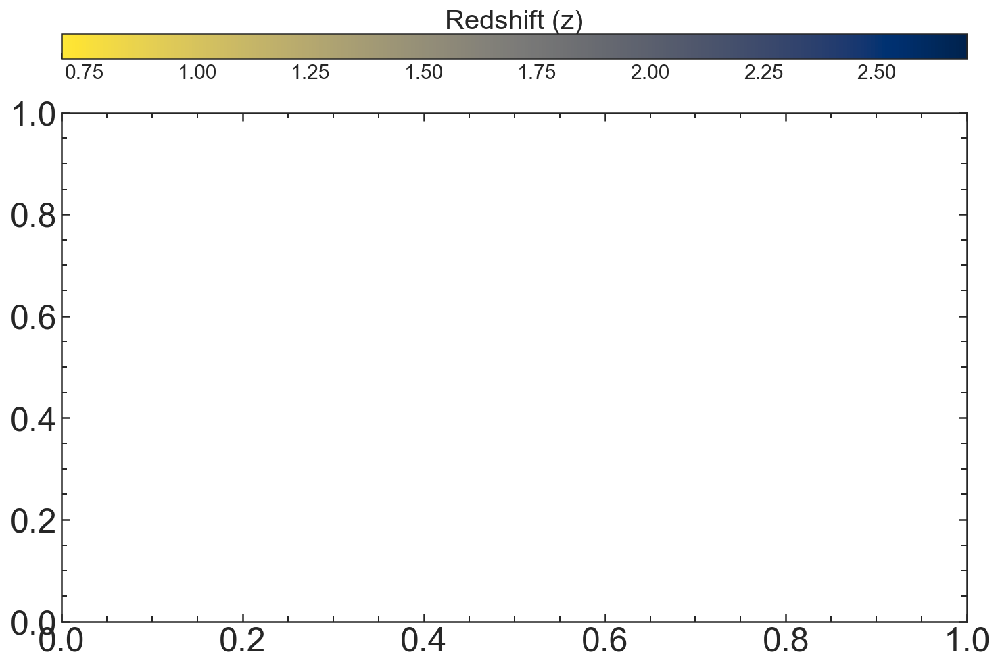

In [156]:
lims= [0.7,1.2,1.7,2.2,2.7]

gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

norm = mpl.colors.Normalize(vmin=0.7, vmax =2.7)
mpl.colorbar.ColorbarBase(ax1, cmap = 'cividis_r', norm=norm, orientation='horizontal')
plt.tick_params(axis='both', which='major', labelsize=25)
ax1.xaxis.set_label_position('top')
ax1.set_xlabel('Redshift (z)', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)

# cols = ['b','r','k']
sea.scatterplot(Adb.query('sf_prob_2 < 0.2').lmass, Adb.query('sf_prob_2 < 0.2').log_Z, 
                hue = Adb.query('sf_prob_2 < 0.2').zgrism, hue_norm = (0.7,2.7),legend=False, palette='cividis_r',
                ax = ax2, edgecolor = 'k', zorder=2, s=100)

for i in range(len(lims)-1):
    sea.regplot(Adb.query('{} < zgrism < {} and sf_prob_2 < 0.2'.format(lims[i], lims[i+1])).lmass,
                Adb.query('{} < zgrism < {} and sf_prob_2 < 0.2'.format(lims[i], lims[i+1])).log_Z,
                lowess = True,ci=68, scatter = False,ax = ax2,truncate = True,
               line_kws = {'linewidth':10, 'alpha':0.5,'zorder':3})
    
ax2.set_ylabel('log(Z/Z$_\odot$)', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=15)
plt.savefig('../plots/research_update/concen_metal_redshift.png', bbox_inches = 'tight')    


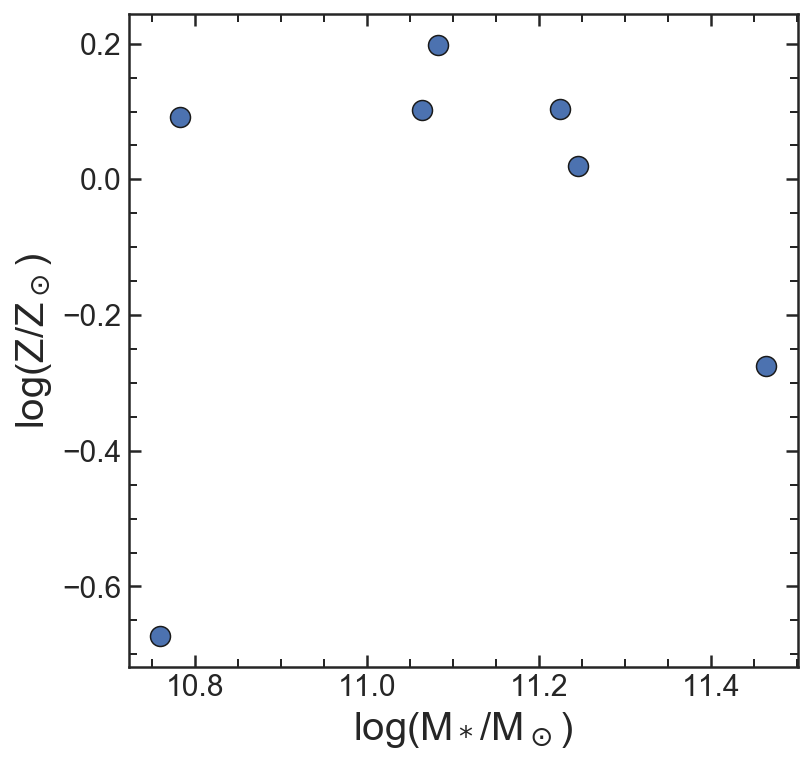

In [594]:
plt.figure(figsize = [6,6])
ax1 = plt.subplot()
sea.scatterplot(Adb.query('sf_prob_2 < 0.2 and 2.2 < zgrism < 2.7').lmass, Adb.query('sf_prob_2 < 0.2 and 2.2 < zgrism < 2.7').log_Z, 
                legend=False, palette='cividis_r', edgecolor = 'k', zorder=2, s=100, ax = ax1)

ax1.set_ylabel('log(Z/Z$_\odot$)', fontsize=20)
ax1.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=15)
plt.savefig('../plots/research_update/concen_metal_highredshift.png', bbox_inches = 'tight')    


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


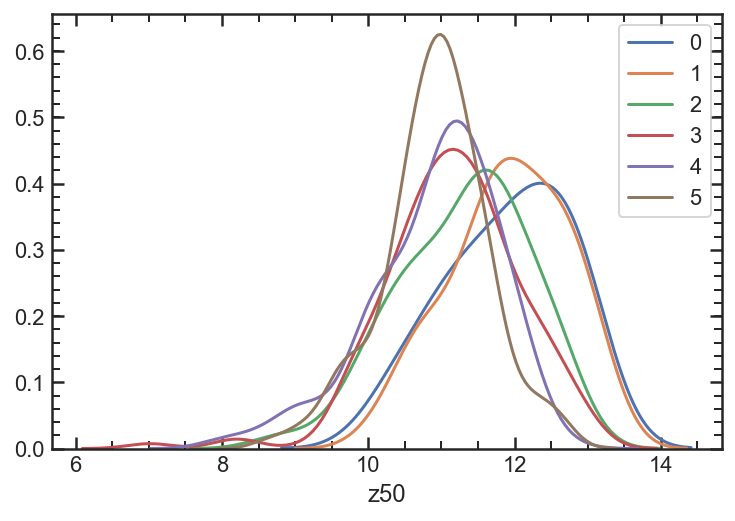

In [603]:
sea.distplot(Adb.query('lmass > 11.25').z50, hist = False, label = '0')
sea.distplot(Adb.query('11. < lmass < 11.25').z50, hist = False, label = '1')
sea.distplot(Adb.query('10.75 < lmass < 11').z50, hist = False, label = '2')
sea.distplot(Adb.query('10.5 < lmass < 10.75').z50, hist = False, label = '3')
sea.distplot(Adb.query('10.25 < lmass < 10.5').z50, hist = False, label = '4')
sea.distplot(Adb.query('10. < lmass < 10.25').z50, hist = False, label = '5')

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


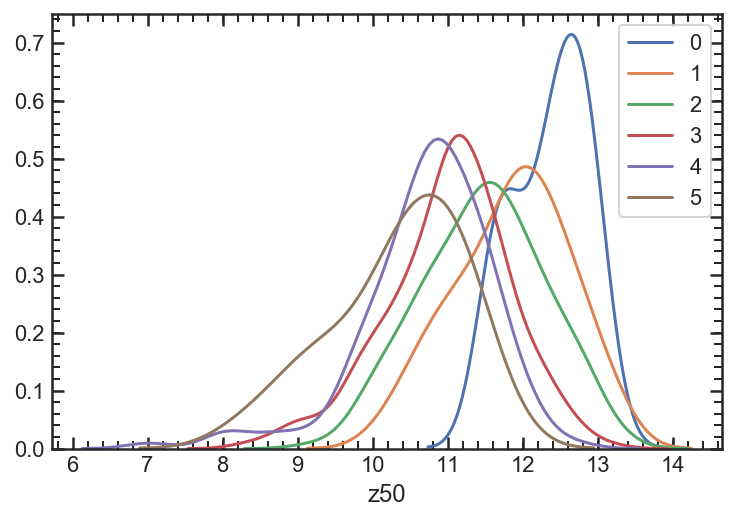

In [605]:
sea.distplot(Adb.query('log_Sigma1 > 10.25').z50, hist = False, label = '0')
sea.distplot(Adb.query('10. < log_Sigma1 < 10.25').z50, hist = False, label = '1')
sea.distplot(Adb.query('9.5 < log_Sigma1 < 10').z50, hist = False, label = '2')
sea.distplot(Adb.query('9 < log_Sigma1 < 9.5').z50, hist = False, label = '3')
sea.distplot(Adb.query('8.5 < log_Sigma1 < 9').z50, hist = False, label = '4')
sea.distplot(Adb.query('8. < log_Sigma1 < 8.5').z50, hist = False, label = '5')

No handles with labels found to put in legend.


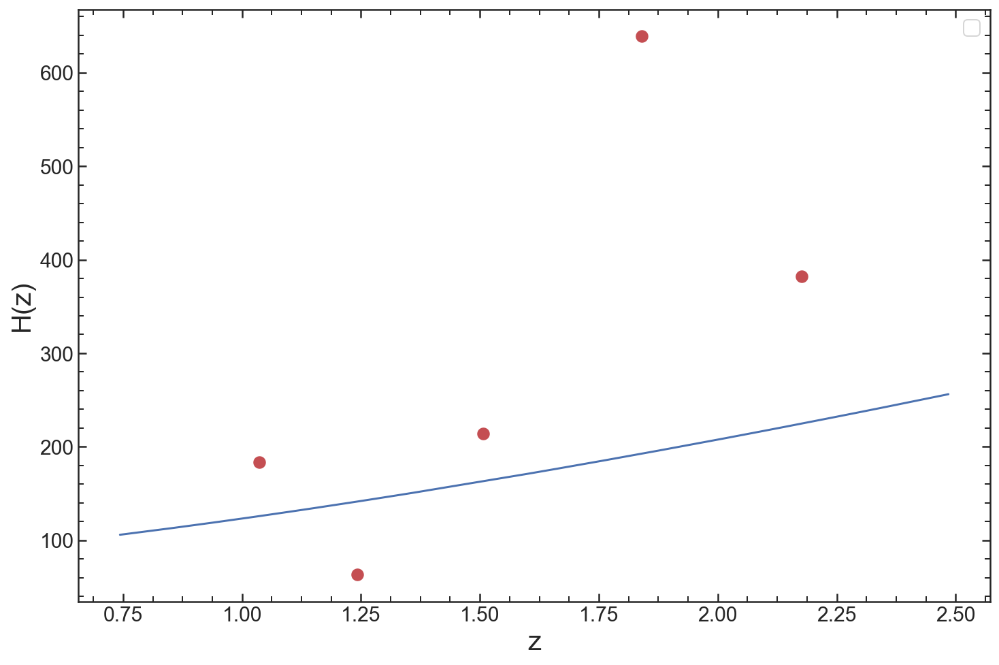

In [221]:
lims = np.arange(0.7,2.6,0.3)
rshifts =Adb.query('log_Sigma1 > 10. and z_50 > 3 and sf_prob_2 < 0.2').sort_values('zgrism').zgrism.values
t50s = Adb.query('log_Sigma1 > 10. and z_50 > 3 and sf_prob_2 < 0.2').sort_values('zgrism').t_50.values

z = []
t = []

for i in range(len(lims)-1):
    zs=[]
    ts=[]
    for ii in range(len(rshifts)):
        if lims[i] < rshifts[ii] < lims[i+1]:
            zs.append(rshifts[ii])
            ts.append(t50s[ii])
    z.append(np.median(zs))
    t.append(np.median(ts))

dz=[]
dt=[]
Z=[]

for i in range(len(z)-1):
    dz.append(z[i+1] - z[i])
    dt.append(t[i+1] - t[i])
    Z.append((z[i+1] + z[i])/2)

dz=np.array(dz)
dt=np.array(dt)
Z=np.array(Z)    
Hz = -1/(1+Z)*dz/(dt*3.154E16) * (1/3.24E-20)   
    
plt.figure(figsize=[12,8])

# sea.scatterplot(rshifts,t50s)
sea.scatterplot(Z,Hz, color = 'r', s=100)
plt.plot(rshifts,cosmo.H(rshifts))
plt.xlabel('z', fontsize=20)
plt.ylabel('H(z)', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(fontsize = 15)


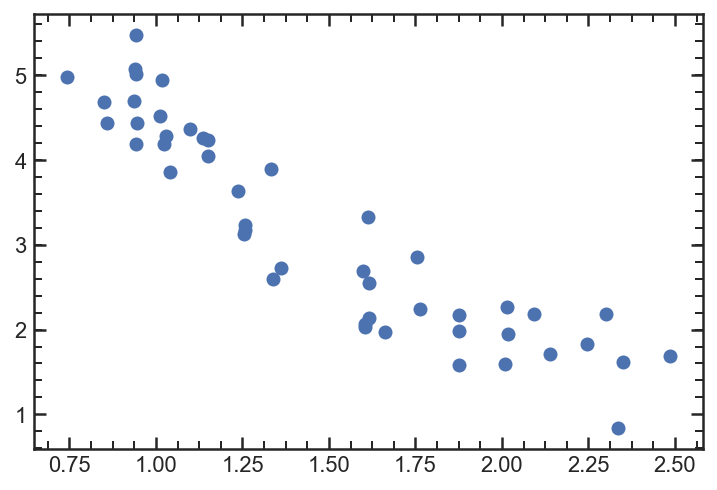

In [216]:
plt.scatter(rshifts,t50s)

In [141]:
from spec_stats import LOWESS
sizes = 1000
xvals = Adb.query('log_Sigma1 > 10. and z_50 > 3').zgrism.values
yvals = Adb.query('log_Sigma1 > 10. and z_50 > 3').t_50.values
choices = np.arange(0, len(xvals),1)
prange = np.linspace(min(xvals), max(xvals), 50)

smooth_grid = []

for i in range(sizes):
    IDX = np.random.choice(choices,len(choices))
    regsDF, evalDF = LOWESS(xvals[IDX], yvals[IDX], alpha = 0.6)

    l_x  = evalDF['v'].values
    l_y  = evalDF['g'].values
    
    
    smooth_grid.append(interp1d(l_x, l_y, bounds_error=False, fill_value=0)(prange))

/Users/Vince.ec/GitHub/Cluster_and_field/scripts/spec_stats.py:468: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  locsDF    = pd.concat([locsDF, iterDF1])
/Users/Vince.ec/GitHub/Cluster_and_field/scripts/spec_stats.py:480: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  evalDF = pd.concat([evalDF, iterDF2])


In [142]:
smooth_grid = np.array(smooth_grid)

Sm = []
Sh = []
Sl = []

for i in range(len(prange)):
    Tarray = smooth_grid.T[i]

    Sm.append(np.percentile(Tarray[Tarray > 0], 50))
    Sh.append(np.percentile(Tarray[Tarray > 0], 84))
    Sl.append(np.percentile(Tarray[Tarray > 0], 16))

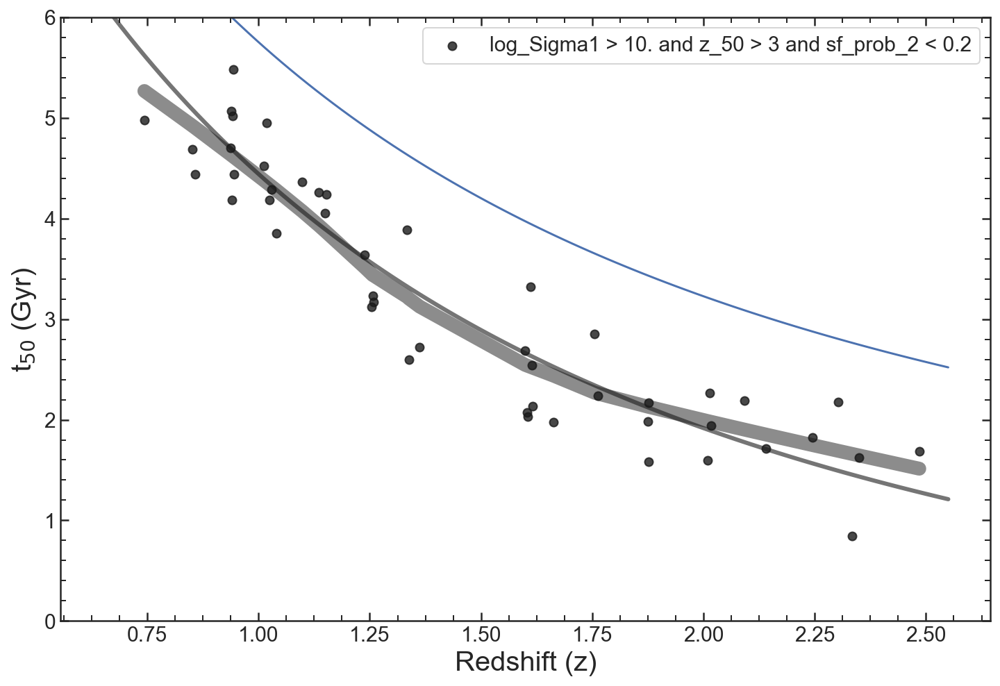

In [166]:
gs = gridspec.GridSpec(2,1,height_ratios=[1,20])

plt.figure(figsize=[12,8])


# cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('log_Sigma1 > 10. and z_50 > 3 and sf_prob_2 < 0.2').zgrism,
            Adb.query('log_Sigma1 > 10. and z_50 > 3 and sf_prob_2 < 0.2').t_50,
            lowess = True, color = 'k', scatter = True , line_kws = {'linewidth':10, 'alpha':0.5,'zorder':1,'color':'k'},
           label = 'log_Sigma1 > 10. and z_50 > 3 and sf_prob_2 < 0.2')

plt.ylim(0,6)
plt.ylabel('t$_{50}$ (Gyr)', fontsize=20)
plt.xlabel('Redshift (z)', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(fontsize = 15)
plt.plot(zs, cosmo.age(zs).value-1.31, 'k', linewidth = 3, alpha = 0.6)

# plt.plot(prange, Sm, 'r')
# plt.plot(prange, Sh, 'k')
# plt.plot(prange, Sl, 'k')

(70, 300)

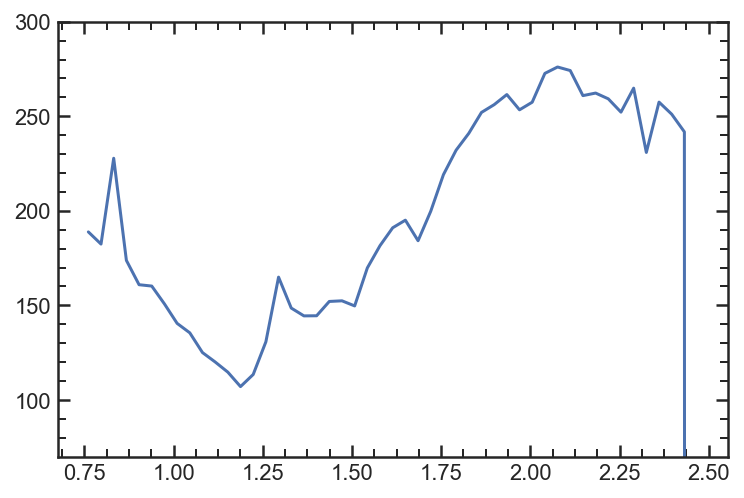

In [152]:
plt.plot(nprange, -1/(1+nprange) * np.diff(prange)/np.diff(np.array(Sm)*3.154E16) * (1/3.24E-20))
plt.ylim(70,300)

In [147]:
nprange = []

for i in range(len(prange)-1):
    nprange.append((prange[i+1] + prange[i]) / 2 )
    
nprange = np.array(nprange)

(70, 300)

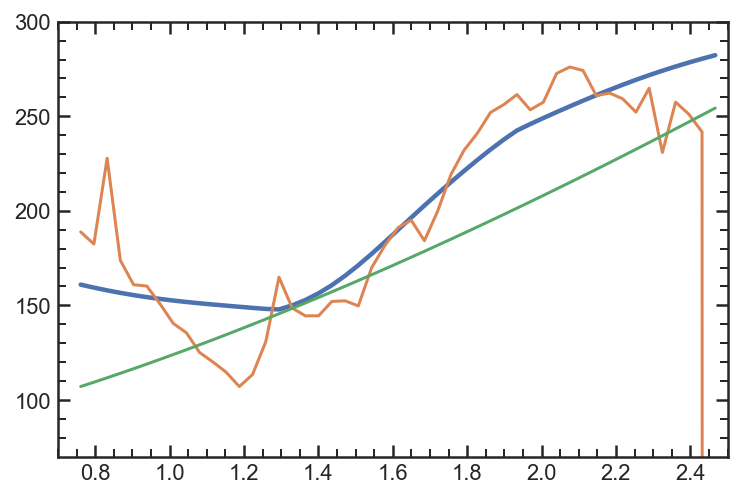

In [153]:
sea.regplot(nprange, -1/(1+nprange) * np.diff(prange)/np.diff(np.array(Sm)*3.154E16) * (1/3.24E-20), 
            lowess=True,scatter=False)
plt.plot(nprange, -1/(1+nprange) * np.diff(prange)/np.diff(np.array(Sm)*3.154E16) * (1/3.24E-20))

plt.plot(nprange,cosmo.H(nprange))
plt.xlim(0.7,2.5)
plt.ylim(70,300)

In [135]:
cosmo.H(nprange)

<Quantity [125.10041684, 137.57616374, 150.8112427 , 164.74753637,
           179.33629426, 194.53648547, 210.31336175, 226.63726624,
           243.48267145] km / (Mpc s)>

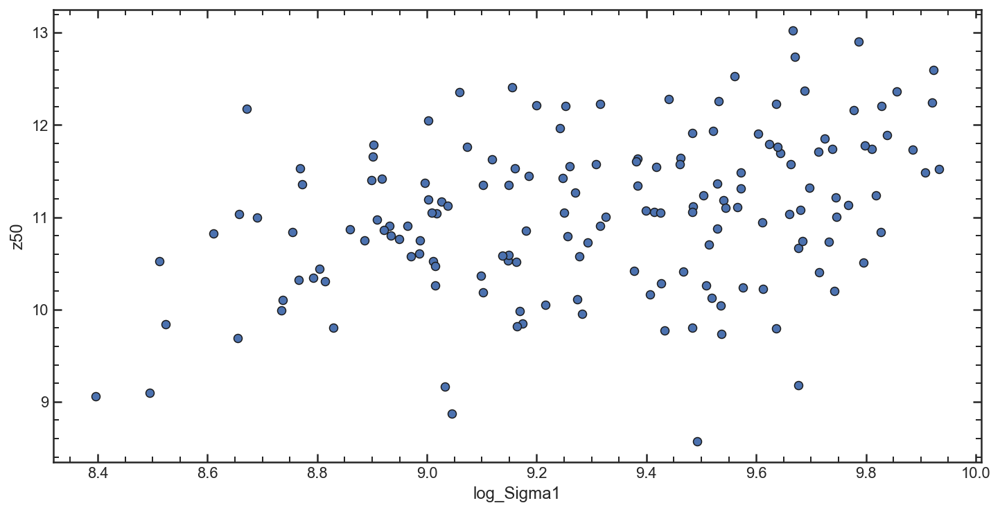

In [234]:
plt.figure(figsize=[12,6])

sea.scatterplot(Adb.query('10.4 < lmass < 10.6').log_Sigma1, Adb.query('10.4 < lmass < 10.6').z50, legend = False, 
                palette='viridis_r', edgecolor = 'k')

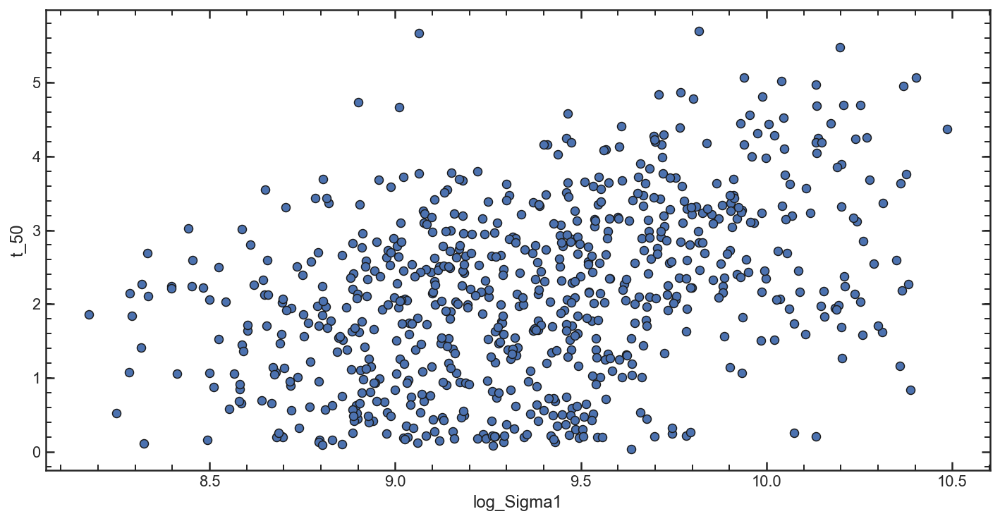

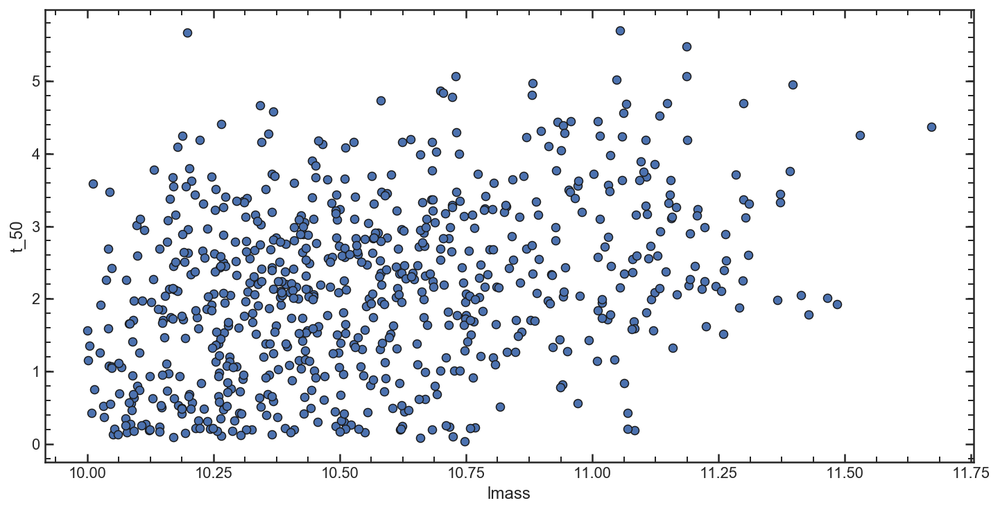

In [248]:
plt.figure(figsize=[12,6])

sea.scatterplot(Adb.log_Sigma1, Adb.t_50, legend = False, 
                palette='viridis_r', edgecolor = 'k')

plt.figure(figsize=[12,6])

sea.scatterplot(Adb.lmass, Adb.t_50, legend = False, 
                palette='viridis_r', edgecolor = 'k')

In [47]:
GND_lines = Table.read('/Volumes/Vince_CLEAR/RELEASE_v3.0.0/grizli_v3.0_cats/GDN_lines_grizli_master.fits', format = 'fits').to_pandas()
GSD_lines = Table.read('/Volumes/Vince_CLEAR/RELEASE_v3.0.0/grizli_v3.0_cats/GDS_lines_grizli_master.fits', format = 'fits').to_pandas()    

In [63]:
Cdb = pd.read_pickle('../dataframes/fitdb/emission_line_galaxies.pkl')

(0, 200)

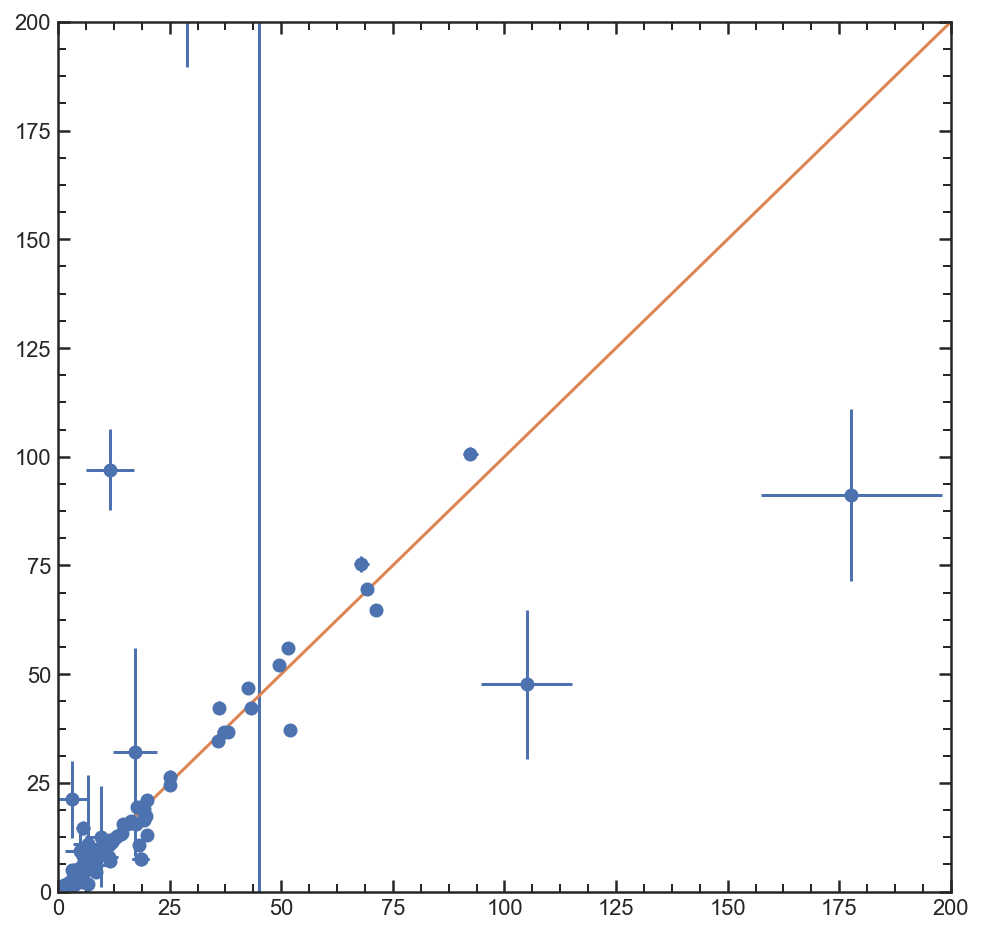

In [90]:
Ha_g = []
Ha_m = []
Ha_g_sig = []
Ha_m_sig = []
for i in Cdb.index:
    m_line = adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).Ha.values
    
    if len(m_line) > 0:
        if m_line > 0:
    
            if Cdb.field[i] == 'GND':
                Ha_g.append(GND_lines.query('ID == {}'.format(Cdb.id[i]))['Ha_FLUX'].values[0])  
                Ha_g_sig.append(GND_lines.query('ID == {}'.format(Cdb.id[i]))['Ha_FLUX_ERR'].values[0])    
                
            if Cdb.field[i] == 'GSD':
                Ha_g.append(GSD_lines.query('ID == {}'.format(Cdb.id[i]))['Ha_FLUX'].values[0])
                Ha_g_sig.append(GSD_lines.query('ID == {}'.format(Cdb.id[i]))['Ha_FLUX_ERR'].values[0])

            Ha_m.append(adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).Ha.values[0])
            Ha_m_sig.append(adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).Ha_sig.values[0])

        
plt.figure(figsize = [8,8])

plt.errorbar(Ha_g, np.array(Ha_m)*1E17, fmt = 'o', xerr = Ha_g_sig, yerr = np.array(Ha_m_sig)*1E17)

plt.plot([0,200],[0,200])
plt.ylim(0,200)
plt.xlim(0,200)

(0, 30)

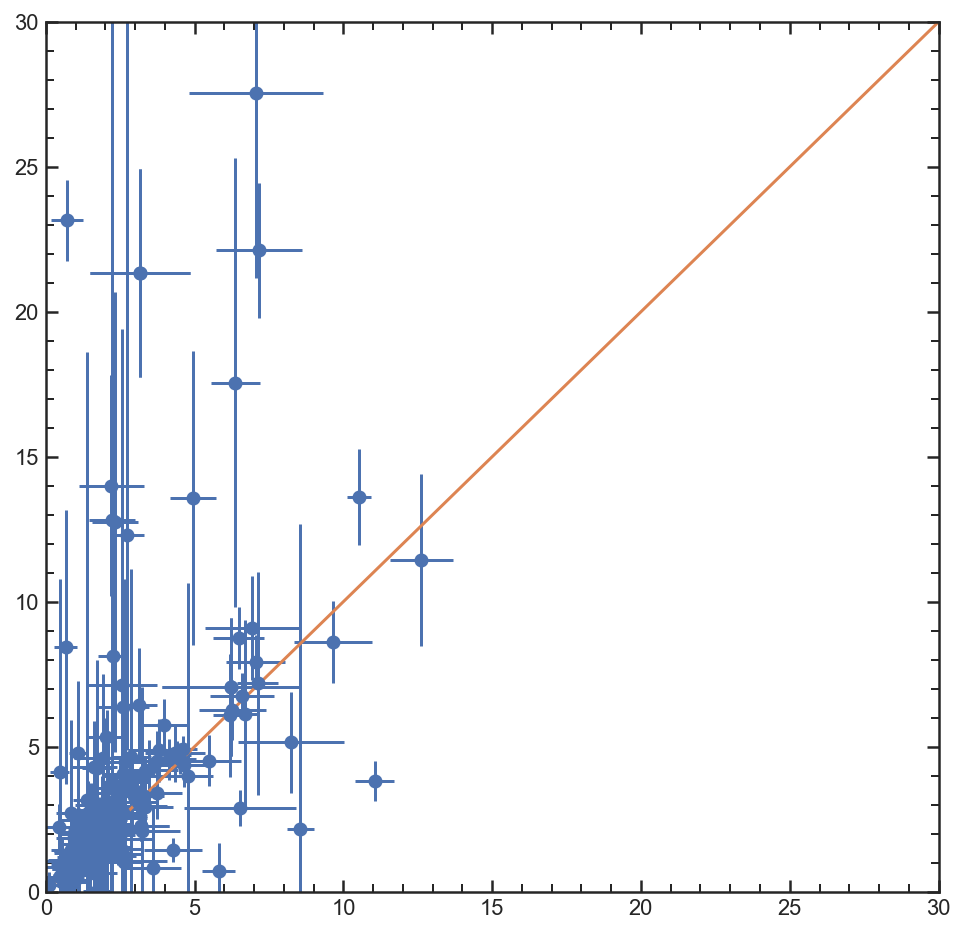

In [100]:
Hb_g = []
Hb_m = []
Hb_g_sig = []
Hb_m_sig = []
for i in Cdb.index:
    m_line = adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).Hb.values
    
    if len(m_line) > 0:
        if m_line > 0:
    
            if Cdb.field[i] == 'GND':
                Hb_g.append(GND_lines.query('ID == {}'.format(Cdb.id[i]))['Hb_FLUX'].values[0])  
                Hb_g_sig.append(GND_lines.query('ID == {}'.format(Cdb.id[i]))['Hb_FLUX_ERR'].values[0])    
                
            if Cdb.field[i] == 'GSD':
                Hb_g.append(GSD_lines.query('ID == {}'.format(Cdb.id[i]))['Hb_FLUX'].values[0])
                Hb_g_sig.append(GSD_lines.query('ID == {}'.format(Cdb.id[i]))['Hb_FLUX_ERR'].values[0])

            Hb_m.append(adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).Hb.values[0])
            Hb_m_sig.append(adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).Hb_sig.values[0])

        
plt.figure(figsize = [8,8])

plt.errorbar(Hb_g, np.array(Hb_m)*1E17, fmt = 'o', xerr = Hb_g_sig, yerr = np.array(Hb_m_sig)*1E17)

plt.plot([0,75],[0,75])
plt.ylim(0,30)
plt.xlim(0,30)

(0, 60)

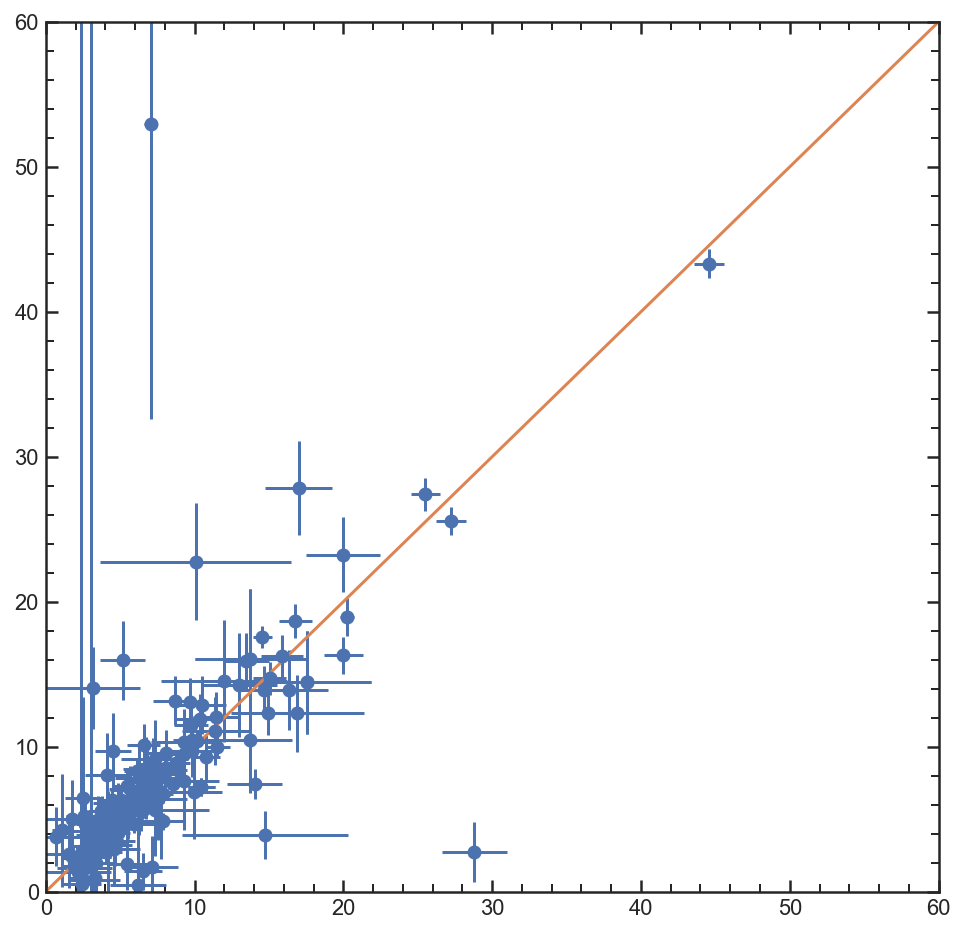

In [93]:
OII_g = []
OII_m = []
OII_g_sig = []
OII_m_sig = []
for i in Cdb.index:
    m_line = adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).OII.values
    
    if len(m_line) > 0:
        if m_line > 0:
    
            if Cdb.field[i] == 'GND':
                OII_g.append(GND_lines.query('ID == {}'.format(Cdb.id[i]))['OII_FLUX'].values[0])   
                OII_g_sig.append(GND_lines.query('ID == {}'.format(Cdb.id[i]))['OII_FLUX_ERR'].values[0])    
                
            if Cdb.field[i] == 'GSD':
                OII_g.append(GSD_lines.query('ID == {}'.format(Cdb.id[i]))['OII_FLUX'].values[0])
                OII_g_sig.append(GSD_lines.query('ID == {}'.format(Cdb.id[i]))['OII_FLUX_ERR'].values[0])

            OII_m.append(adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).OII.values[0])
            OII_m_sig.append(adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).OII_sig.values[0])

        
plt.figure(figsize = [8,8])

plt.errorbar(OII_g, np.array(OII_m)*1E17, fmt = 'o', xerr = OII_g_sig, yerr = np.array(OII_m_sig)*1E17)

plt.plot([0,600],[0,600])
plt.ylim(0,60)
plt.xlim(0,60)

(0, 60)

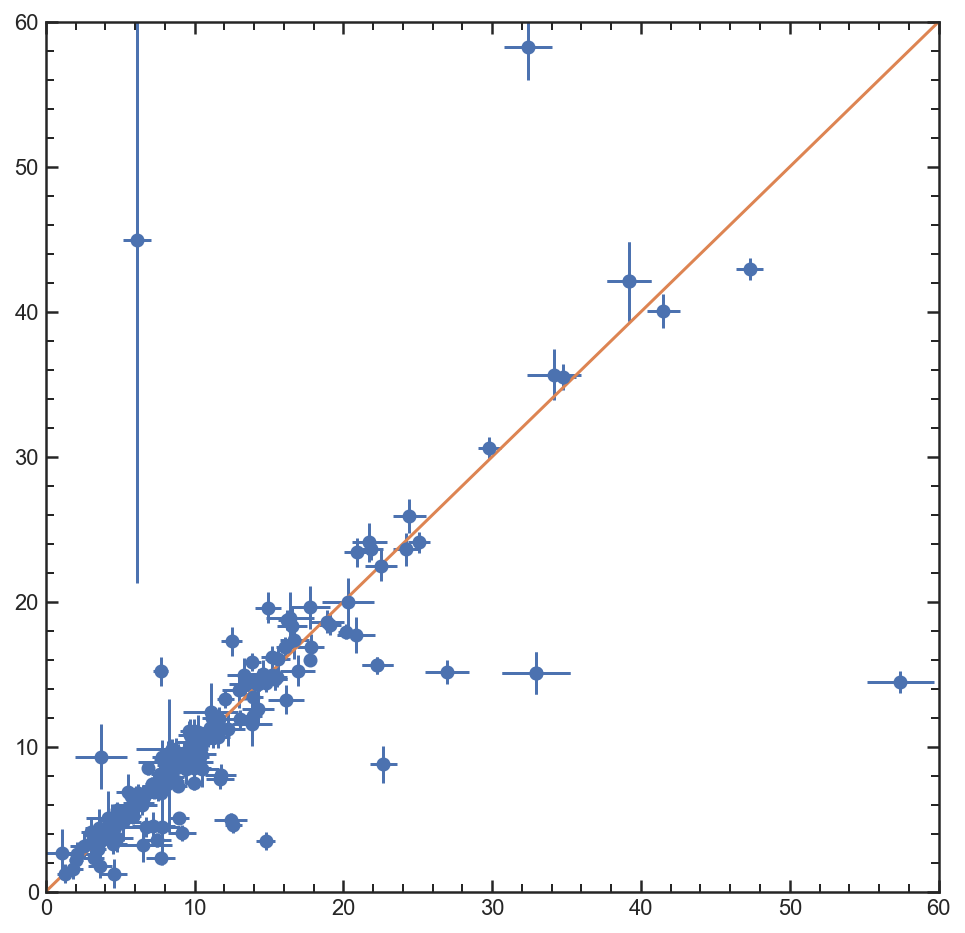

In [96]:
OIII_g = []
OIII_m = []
OIII_g_sig = []
OIII_m_sig = []
for i in Cdb.index:
    m_line = adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).OIII.values
    
    if len(m_line) > 0:
        if m_line > 0:
    
            if Cdb.field[i] == 'GND':
                OIII_g.append(GND_lines.query('ID == {}'.format(Cdb.id[i]))['OIII_FLUX'].values[0])   
                OIII_g_sig.append(GND_lines.query('ID == {}'.format(Cdb.id[i]))['OIII_FLUX_ERR'].values[0])    
                
            if Cdb.field[i] == 'GSD':
                OIII_g.append(GSD_lines.query('ID == {}'.format(Cdb.id[i]))['OIII_FLUX'].values[0])
                OIII_g_sig.append(GSD_lines.query('ID == {}'.format(Cdb.id[i]))['OIII_FLUX_ERR'].values[0])

            OIII_m.append(adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).OIII.values[0])
            OIII_m_sig.append(adb.query('field == "{}" and id == {}'.format(Cdb.field[i], Cdb.id[i])).OIII_sig.values[0])

        
plt.figure(figsize = [8,8])

plt.errorbar(OIII_g, np.array(OIII_m)*1E17, fmt = 'o', xerr = OIII_g_sig, yerr = np.array(OIII_m_sig)*1E17)

plt.plot([0,200],[0,200])
plt.ylim(0,60)
plt.xlim(0,60)